<a href="https://colab.research.google.com/github/seungheonbaek58-jpg/SCODA/blob/main/scoda_practice_workshop_3a_colitis_mm_251228.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  __Using <font color=blue><a href=https://mlbi-lab.net>SCODA</a></font> for Single-cell RNA-seq data analysis and mining__

- This Jupyter notebook provides example code for visualizing and mining the results processed by <a href=https://mlbi-lab.net>__SCODA__</a>, a single-cell RNA-seq data analysis pipeline developed by __MLBI Lab__.
- Data mining is conducted using the __SCODA-viz__ package and includes the following components:

<br>

1. <font color=blue>Review of cell type annotation results</font>
   - Preprocessing for visualization and generation of UMAP coordinates
   - Visualization of celltype marker expression patterns
   - Examination of cell type populations and identification of condition-specific features
2. <font color=blue>Review of CNV and tumor cell identification results</font>
   - Visualization of CNV patterns via heatmap
   - Tumor cell identification confirmed via UMAP projection
3. <font color=blue>Profiling of ligand–receptor interactions between cell types</font>
  - Structure and composition of CCI result data
  - Visualization using dot plots and circle plots
  - Statistical testing of condition-specific interactions and visualization via boxplots
4. <font color=blue>Differential expression analysis and marker/target discovery</font>
  - Structure of DEG result data
  - Inspection of DEG results
  - Marker/target discovery and visualization using dot plots
5. <font color=blue>Gene set analysis (GSA) and interpretation of enrichment results</font>
  - Structure of GSA/GSEA output data
  - Visualization of GSA/GSEA results using barplots
  - Visualization of GSA/GSEA results using dotplots

6. <font color=firebrick>Auxiliary analysis using cancer genomics big data</font> (e.g., METABRIC or TCGA data)
7. <font color=firebrick>Visualization of pathway-level changes using KEGG Pathview</font> (provided in a separate notebook using R)

<br>

__MLBI-lab, July 27, 2025__

contact: mlbi@mlbi-lab.com




## __1. Install required packages and import them__

In [ ]:
## 필요한 패키지 설치 (이미 설치되었다면 skip 해도 됩니다.)
'''
!pip install gdown
!pip install numpy
!pip install pandas
!pip install scipy
!pip install matplotlib
!pip install scikit-learn
!pip install seaborn
!pip install scikit-network
!pip install statannot
!pip install statannotations
!pip install lifelines
!pip install plotly
'''
!pip install scanpy
!pip install scoda-viz==0.4.36b
## This jupyter notebook was tested with the above version of scoda-viz package.

In [ ]:
## 필요한 패키지 불러오기
import copy, warnings, os
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scodaviz import plot_population, plot_population_grouped
from scodaviz import plot_cci_dot, plot_cci_circ_group
from scodaviz import plot_gsa_bar, plot_gsa_dot, add_to_subset_markers
from scodaviz import plot_deg, plot_marker_exp, plot_cnv_hit
from scodaviz import plot_cnv, plot_violin, plot_pct_box
from scodaviz import get_sample_to_group_map, plot_sankey

from scodaviz import get_population_per_sample, get_cci_means, get_gene_expression_mean
from scodaviz import get_markers_from_deg, test_group_diff, filter_gsa_result
from scodaviz import find_condition_specific_markers, find_genomic_spots_of_cnv_peaks
from scodaviz import load_scoda_processed_sample_data, get_abbreviations, decompress_tar_gz
from scodaviz import get_amp_regions_for_known_markers, plot_cnv_stat
from scodaviz.misc import show_tree, scoda_ai

warnings.filterwarnings('ignore')

https://github.com/combio-dku
INFO: statannotations was sucessfully installed.


### <font color='blue'>__✅ SCODA AI 사용하기__</font>
- scoda_ai를 사용하면 일부 데이터들에 대한 설명과 해당 데이터에 근거하여 어떤 실험을 기획할 수있는지 물어볼 수 있습니다.
- [google AI studio](https://aistudio.google.com/)으로 가셔서 본인의 구글 계정으로 로그인하신 후 프로젝트를 하나 만드시고 해당 프로젝트의 api_key를 복사해서 scoda_ai 객체를 생성할 수 있습니다.
- api_key를 복사하신 후 좌측 열쇠아이콘에 scoda라는 이름으로 키를 설정하세요
- 🚀 본인의 api_key는 다른 사람이 도용하여 사용할 수도 있으니 다른 사람에게 보여주지 마십시오.
- <font color='red'>api_key 도용에 따른 피해는 책임지지 않습니다 ^^.</font>

In [ ]:
from google.colab import userdata
your_api_key = userdata.get('your_key_name')
ai = scoda_ai(api_key = your_api_key)

- ✨ 사용은 요렇게:   ai.ask( your_data, '요 데이터 설명 좀~' )

In [ ]:
## 테스트
ai.ask( "아직 데이터는 없지만 ..", "뒤에가서 많이 물어보께~")

## __2A. Download a preprocessed data__

In [ ]:
dataset = 'Colitis-mm'  ## You can choose one of ['BC', 'NSCLC', 'PDAC', 'CRC', 'Colitis-mm', 'Colitis-hs']
adata_t = load_scoda_processed_sample_data( dataset )
adata_t

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1bs3QfJUO0X76sI3eKgAUhWSfKfPknL8L
From (redirected): https://drive.google.com/uc?export=download&id=1bs3QfJUO0X76sI3eKgAUhWSfKfPknL8L&confirm=t&uuid=0694c986-8f1d-401a-b65c-2d317f197849
To: /content/downloaded
100%|██████████| 221M/221M [00:05<00:00, 43.8MB/s]


File saved to: colon_mm_GSE264408_39K_scoda_results.h5ad


AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'celltype_for_cci'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

## __2B. Or, load your h5ad file__
데이터를 불러오려면 호스팅 된 Colab 서버에 h5ad파일을 직접 업로드하거나 본인 계정의 구글 드라이브를 마운트하여 가져올 수 있습니다.

In [ ]:
file_h5ad = 'colon_mm_GSE264408_39K_scoda_results.h5ad'

## Or, run
## file_h5ad = decompress_tar_gz('your_tar_gz_file')

In [ ]:
adata_t = sc.read_h5ad(file_h5ad)
adata_t

## __3. Check your SCODA-processed data__

#### __AnnData Format:__ https://anndata.readthedocs.io/en/stable/
  
<div>
<img src="https://drive.google.com/uc?export=view&id=1IGjZpO_DeaNFiX3u_fy_rnPC1oKwVsqU" align="center" width="500"/>
</div>
<div>
<img src="attachment:fefeae20-ad05-4cea-8327-72f3dd19903f.png" width="500"/>
</div>

#### __Basic operations__
1. cell selection, gene selection (supports boolean indexing as for DataFrame)
3. writing to a file
4. getting cell-by-gene count matrix as a data frame
5. adding an annotation

In [ ]:
adata_t

In [ ]:
show_tree(adata_t, max_depth = 3, n_to_show = 3)

In [ ]:
adata_t.obs.head()

In [ ]:
## Cell-selection example
b = adata_t.obs['celltype_major'] == 'Epithelial cell'
adata = adata_t[b,:]
adata

In [ ]:
adata.obs['sample'].value_counts()

In [ ]:
## Example: writing anndata to a file
adata.write('Epi_only.h5ad')

In [ ]:
## Example: getting cell-by-gene count matrix as a data frame
X_full = adata.to_df()
X_full.head()

-  #### SCODA를 이용하여 생성된 결과
    - __적용된 분석 파라미터__: adata_t.uns['analysis_parameters']
    - __celltype annotation 결과__: adata_t.obs[['celltype_major', 'celltype_minor', 'celltype_subset']]
    - __celltype annotation 결과의 상세내용__: adata_t.obsm['HiCAT_result']
    - __celltype annotation에 사용된 celltype marker 정보__: adata_t.uns['Celltype_marker_DB']
    - __InferCNV 결과__: adata_t.obsm['X_cnv'], adata_t.obsm['X_cnv_pca'], adata_t.obs[['cnv_score', 'cnv_cluster']]
    - __InferCNV 분석 파라미터 및 관련 정보__: adata_t.uns['cnv'], adata_t.uns['cnv_neighbors_info'], adata_t.uns['cnv_ref_celltypes']
    - __InferPloidy 결과__: adata_t.obs[['ploidy_dec', 'ploidy_score']
    - __Cell간 상호작용 추론 결과__: adata_t.uns['CCI_sample'] (샘플별), adata_t.uns['CCI'] (조건별)
    - __DEG 결과__: adata_t.uns['DEG'], adata_t.uns['DEG_stat']
    - __GSA/GSEA 결과__: adata_t.uns['GSA_down'], adata_t.uns['GSA_up'], adata_t.uns['GSEA']

In [ ]:
adata_t.obs[['sample', 'condition']].value_counts()

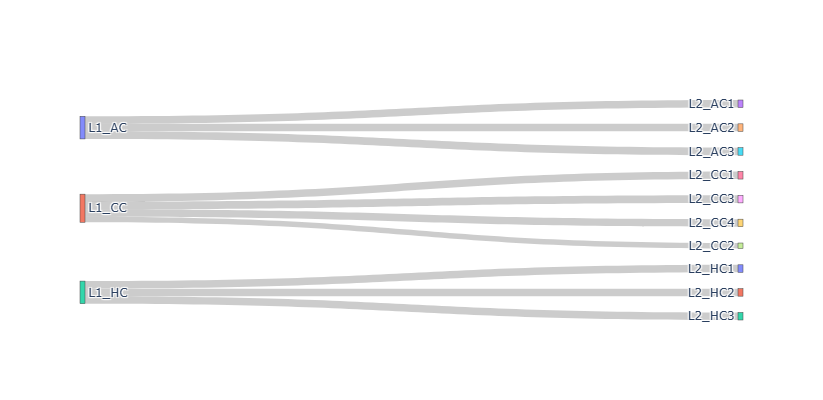

In [ ]:
lst = [adata_t.obs['condition'], adata_t.obs['sample']]
plot_sankey(lst, title=None, fs=12, WH=(400, 400), th=30, title_y=0.85 )

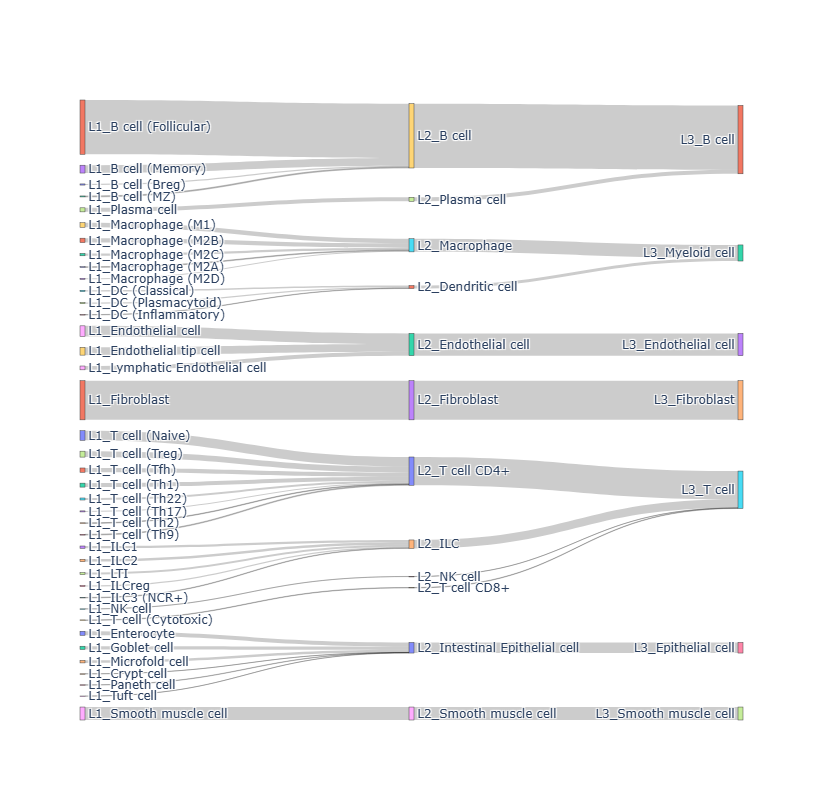

In [ ]:
lst = [adata_t.obs['celltype_subset'], adata_t.obs['celltype_minor'], adata_t.obs['celltype_major']]
plot_sankey(lst, title=None, fs=12, WH=(700, 800), th=10, title_y=0.85 )

In [ ]:
adata_t.obs['celltype_major'].value_counts()

In [ ]:
adata_t.obs['celltype_minor'].value_counts()

In [ ]:
adata_t.uns['analysis_parameters']

In [ ]:
adata_t.obsm['HiCAT_result']

## __4. Explore your data__
A. <font color=blue>세포유형 식별결과 확인</font>
   - 시각화를 위한 기본 처리 및 UMAP 좌표 생성
   - 세포유형 마커 발현 패턴 확인
   - 세포유형 population 확인 및 조건특이적 특징 판별

B. <font color=blue>CNV 및 암세포 식별 결과 확인</font>
   - CNV heatmap 확인
   - UMAP을 통한 암세포 식별 결과 확인

C. <font color=blue>세포유형간 ligand-receptor 상호작용 프로파일</font>
   - 결과 데이터의 구성
   - dot plot 및 circle plot을 이용한 확인
   - 조건-특이적 상호작용의 통계적 검정 및 boxplot을 이용한 확인   

D. <font color=blue>DEG 분석 결과 및 마커/표적 탐색</font>
   - DEG 결과 데이터의 구성
   - DEG 결과의 확인
   - 마커/표적 탐색 및 dotplot을 이용한 확인

E. <font color=blue>유전자 집합 분석(Gene Set Analysis) 결과 확인</font>
  - GSA/GSEA 결과 데이터의 구성
  - barplot을 이용한 GSA/GSEA 결과의 확인
  - dotplot을 이용한 GSA/GSEA 결과의 확인

F. <font color=firebrick>암유전체 빅데이터의 보조적 활용</font>

G. <font color=firebrick>KEGG pathview 생성하여 pathway상의 변화 확인</font> (별도의 주피터 노트북 제공)

### __A.1 Basic preprocessing for UMAP projection__
- __SCANPY:__ https://scanpy.readthedocs.io/en/stable/

In [ ]:
## adata_t의 사본을 만들어서 adata에 저장
adata = adata_t[:,:].copy()
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)
try:
    sc.tl.pca(adata, n_comps = 15, mask_var="variable_genes")
except:
    sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

### __A.2 An overview of celltype annotation result__
- __HiCAT:__ https://github.com/combio-dku/HiCAT

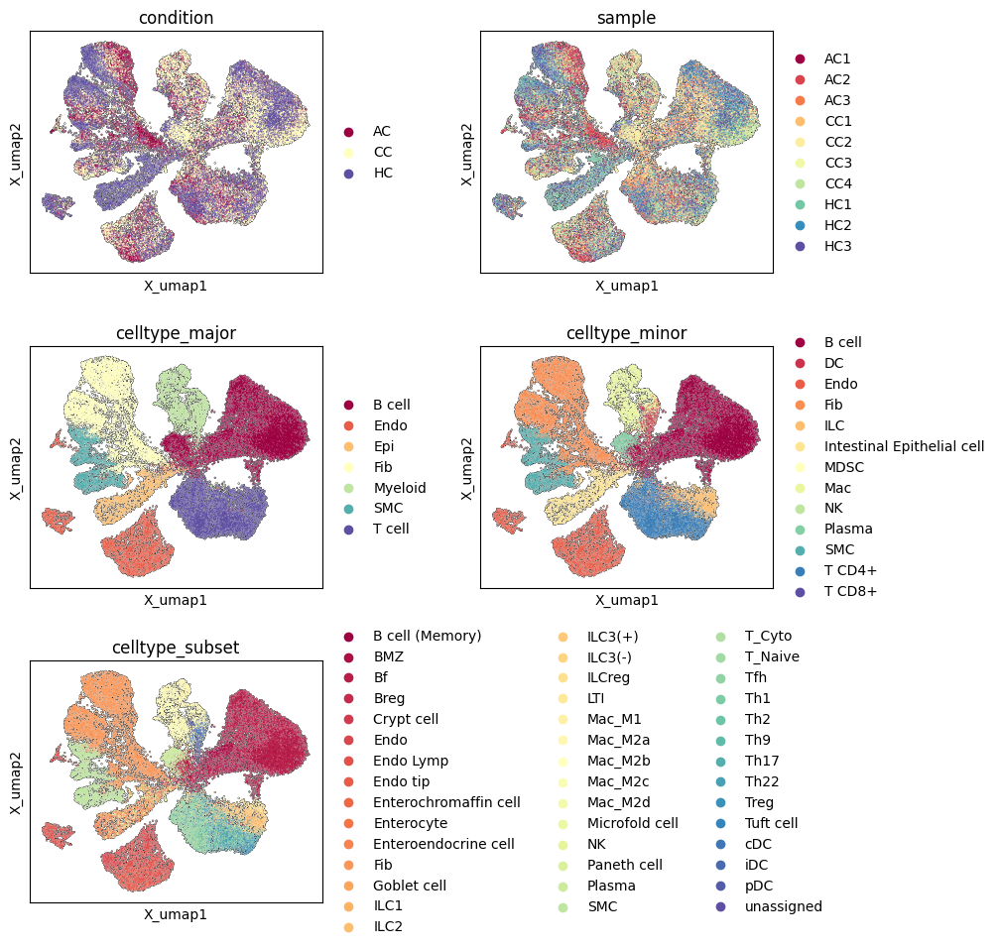

In [ ]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

## Abbreviate cell names
cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata,
                 basis = 'X_umap',
                 neighbors_key = 'neighbors',
                 color=items_to_plot,
                 wspace = 0.4,
                 hspace = 0.3,
                 legend_fontsize = 10,
                 ncols = 2,
                 palette = 'Spectral',
                 add_outline = True)

### __A.3 Inspecting minor-type annotation result__

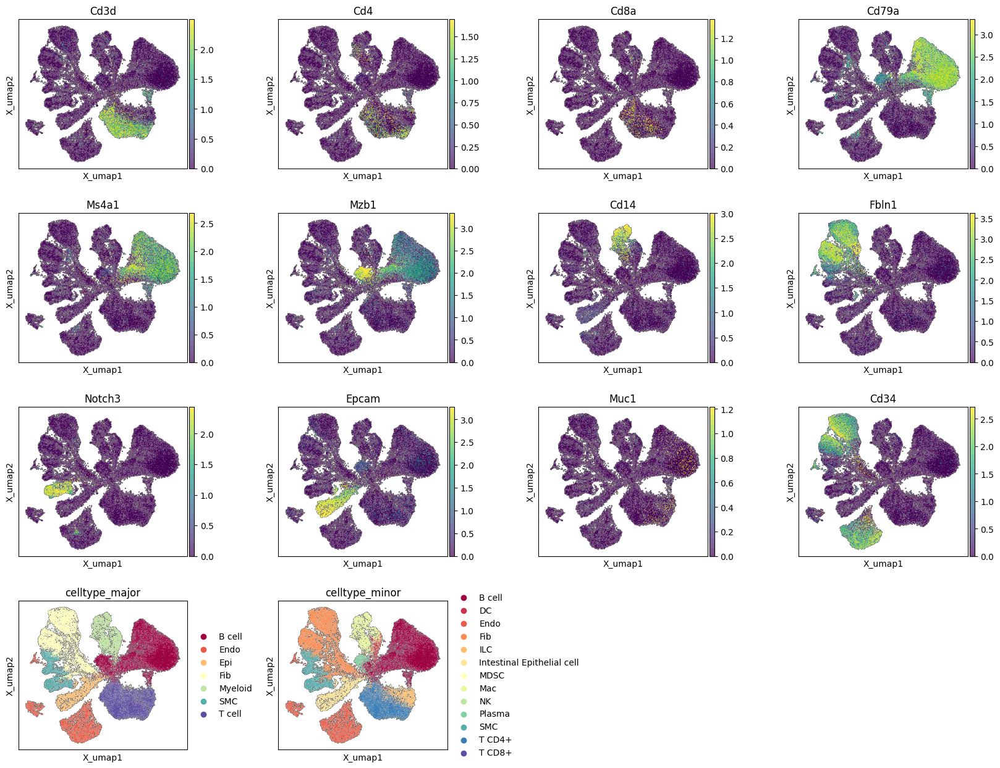

In [ ]:
items_to_plot = ['celltype_major', 'celltype_minor']

if adata_t.uns['usr_param']['species'] == 'human':
    genes = ['CD3D', 'CD4', 'CD8A', 'CD79A', 'MS4A1', 'MZB1',
             'CD14', 'LYZ', 'FBLN1', 'NOTCH3', 'EPCAM', 'MUC1',  'CD34']
else:
    genes = ['Cd3d', 'Cd4', 'Cd8a', 'Cd79a', 'Ms4a1', 'Mzb1',
             'Cd14', 'Lyz', 'Fbln1', 'Notch3', 'Epcam', 'Muc1',  'Cd34']

## 위 목록의 마커 유전자들 중 현재의 데이터에 있는 유전자들만 순서대로 선택
genes_all = list(adata.var.index.values)
items_to_plot = [g for g in genes if g in genes_all] + items_to_plot

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata,
                 basis = 'X_umap',
                 neighbors_key = 'neighbors',
                 color=items_to_plot,
                 wspace = 0.4,
                 hspace = 0.3,
                 legend_fontsize = 10,
                 ncols = 4,
                 palette = 'Spectral',
                 add_outline = True,
                 vmax = 'p99',
                 vmin = 0)

#### __A.4 Subset marker expression profile__
- Subset annotation은 UMAP으로 확인하기 어려우므로 dot plot을 사용하여 확인
- dot의 크기는 annotation 결과 기준으로 해당 유형의 세포 중 얼마나 많은 비율이 해당 유정의 마커 유전자를 발현하고 있는지 보여줌


Num markers selected: 167 -> 120


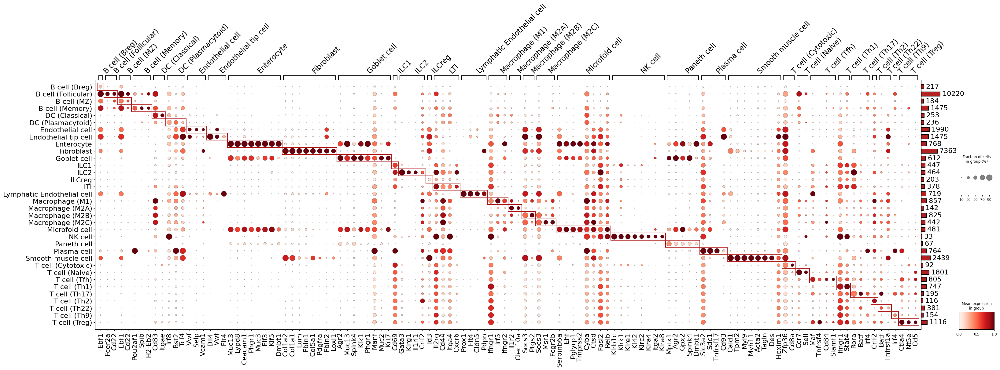

In [ ]:
mkr_dct_selected = plot_marker_exp( adata_t,
                                    markers = None,
                                    N_cells_per_group_min = 30,
                                    N_markers_per_group_max = 8,
                                    N_markers_total = 120,
                                    title = None,
                                    title_y_pos = 1.1,
                                    title_fs = 30,
                                    text_fs = 16,
                                    standard_scale = 'var',
                                    var_group_rotation = 45,
                                    var_group_height = 1.2,
                                    nz_frac_max = 0.9,
                                    nz_frac_cutoff = 0.05,
                                    rem_mkrs_common_in_N_groups_or_more = 3,
                                    figsize = None,
                                    swap_ax = False,
                                    legend = True,
                                    cmap = 'Reds',
                                    linewidth = 1.5,
                                    linecolor = 'firebrick')

### __Practice:__ Visualizing Myeloid cell subsets

In [ ]:
b = adata_t.obs['celltype_major'] == 'Myeloid cell'
adata = adata_t[b,:].copy()

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 1000)
try:
    sc.tl.pca(adata, n_comps = 15, mask_var="variable_genes")
except:
    sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

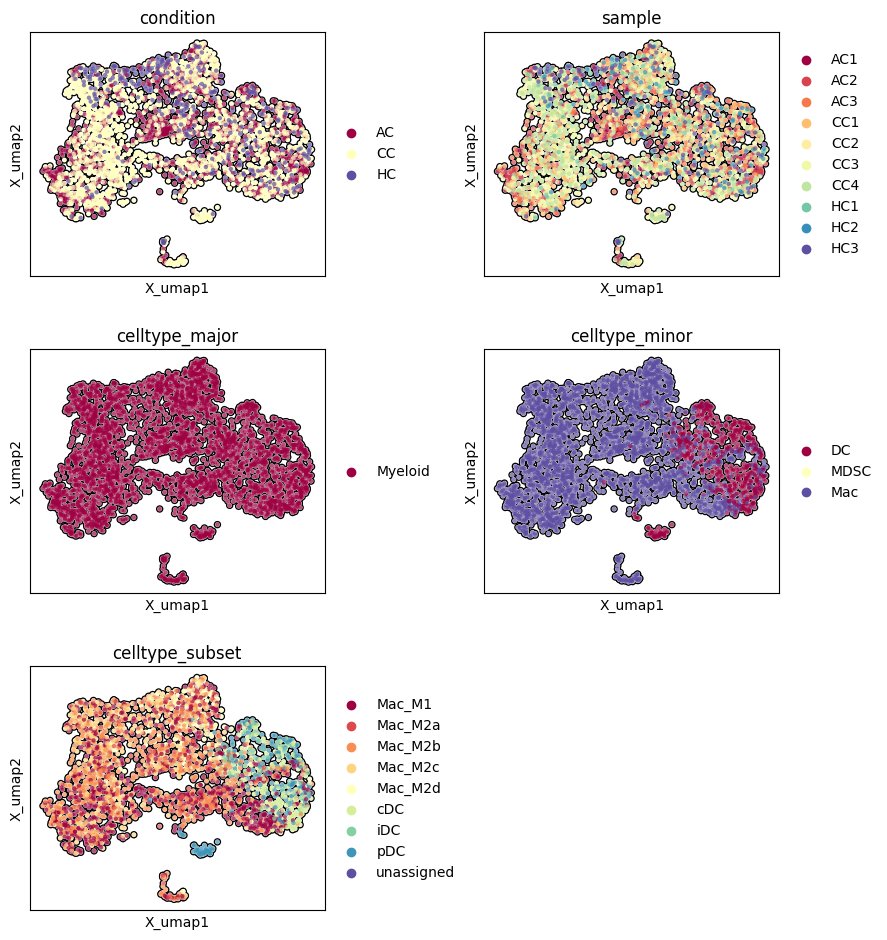

In [ ]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata,
                 basis = 'X_umap',
                 neighbors_key = 'neighbors',
                 color=items_to_plot,
                 wspace = 0.4,
                 hspace = 0.3,
                 legend_fontsize = 10,
                 ncols = 2,
                 palette = 'Spectral',
                 add_outline = True)

### __A.5 Inspecting celltype population__


,Group,B cell,Dendritic cell,Endothelial cell,Fibroblast,ILC,Intestinal Epithelial cell,MDSC,Macrophage,NK cell,Plasma cell,Smooth muscle cell,T cell CD4+,T cell CD8+
AC1,AC,10.7,1.6,18.3,39.2,4.8,1.3,0.0,5.6,0.0,0.2,9.6,8.3,0.3
AC2,AC,15.8,1.4,15.9,30.0,4.7,0.4,0.0,7.1,0.2,0.3,7.6,16.3,0.4
AC3,AC,33.3,2.4,9.3,10.1,5.1,1.0,0.0,7.7,0.1,1.0,3.2,26.2,0.6
CC1,CC,60.2,2.0,5.0,4.5,2.1,0.8,0.0,6.3,0.0,4.1,5.6,9.3,0.2
CC2,CC,60.6,1.1,5.3,3.6,1.3,2.2,0.0,4.7,0.0,5.8,5.4,9.9,0.1
CC3,CC,33.2,2.0,11.0,12.7,3.7,2.7,0.0,14.5,0.2,2.4,4.8,12.8,0.1
CC4,CC,23.9,2.2,14.6,20.6,4.6,1.8,0.0,10.7,0.3,1.6,7.3,12.3,0.1
HC1,HC,11.5,0.3,10.0,25.5,5.2,24.8,0.0,2.0,0.0,1.0,7.6,12.1,0.2
HC2,HC,46.0,0.7,5.9,14.6,3.9,4.7,0.0,2.0,0.0,1.6,4.0,16.4,0.2
HC3,HC,23.9,0.6,10.9,24.3,5.0,10.7,0.0,2.4,0.0,2.7,7.4,11.9,0.2


<Figure size 350x350 with 0 Axes>

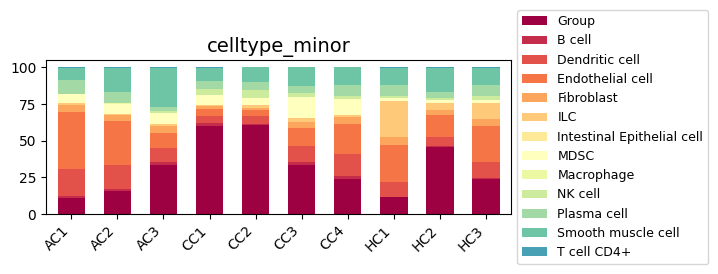

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population_per_sample( adata_t, celltype_col, sort_by = [] )

## 샘플별 세포 개수 확인
display(df_pct.round(1))

plot_population( df_pct,
                 bar_width = 0.6,
                 title = celltype_col,
                 title_fs = 14,
                 label_fs = 12,
                 tick_fs = 10,
                 xtick_rot = 45,
                 xtick_ha = 'right',
                 legend_fs = 9,
                 legend_loc = 'center left',
                 bbox_to_anchor = (1,0.5),
                 legend_ncol = 1,
                 cmap = None,
                 figsize=(6, 2),
                 dpi = 100)

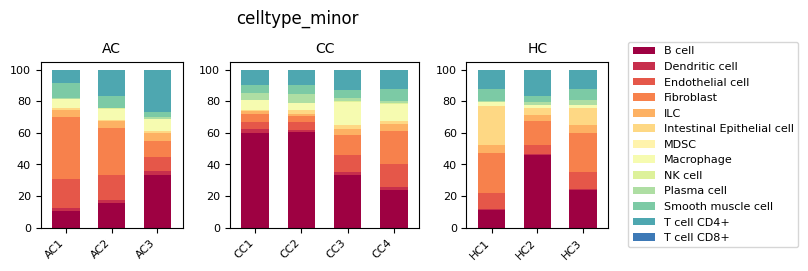

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population_per_sample( adata_t, celltype_col, sort_by = [], sample_col = 'sample' )

plot_population_grouped( df_pct,
                         sort_by = [],
                         bar_width = 0.6,
                         title = celltype_col,
                         title_fs = 12,
                         title_y_pos = 1.2,
                         label_fs = 10,
                         tick_fs = 8,
                         xtick_rot = 45,
                         xtick_ha = 'right',
                         legend_fs = 8,
                         legend_loc = 'center left',
                         bbox_to_anchor = (1.1,0.5),
                         legend_ncol = 1,
                         cmap = None,
                         figsize=(7, 2),
                         dpi = 100,
                         wspace = 0.3,
                         hspace = 0.2 )

### __A.6 Inspecting condition-specificity in celltype population__

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population_per_sample( adata_t, celltype_col, sort_by = [], sample_col = 'sample' )

## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

df_res = test_group_diff( df_pct,
                          ref_group = None,
                          pval_cutoff = 0.8 )
display(df_res)

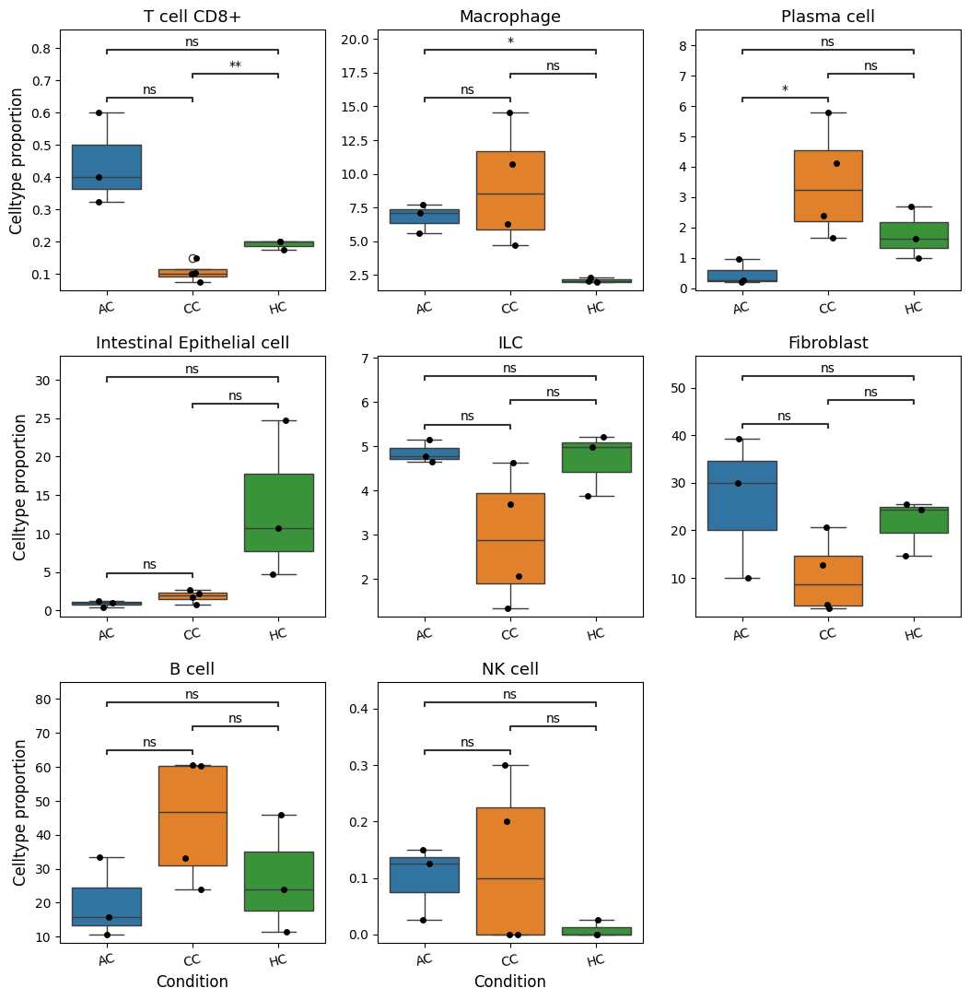

In [ ]:
## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel],
                 df_pct['Group'],
                 ylabel = 'Celltype proportion',
                 ncols = 3,
                 figsize = (3.5,3.5),
                 dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None,
                 title_y_pos = 1.05,
                 title_fs = 15,
                 label_fs = 12,
                 tick_fs = 10,
                 xtick_rot = 15,
                 annot_ref = None,
                 annot_fmt = 'star',
                 annot_fs = 10,
                 ws_hs = (0.2, 0.25),
                 stripplot = True,
                 stripplot_ms = 5,
                 cmap = 'tab10')

#### __Practice: Inspecting subset population__

,Group,Macrophage (M1),Macrophage (M2A),Macrophage (M2B),Macrophage (M2C),Macrophage (M2D)
AC1,AC,84,12,88,21,18
AC2,AC,97,12,111,44,20
AC3,AC,101,19,102,58,28
CC1,CC,96,8,78,46,24
CC2,CC,51,5,43,27,11
CC3,CC,228,33,178,106,36
CC4,CC,138,30,146,86,29
HC1,HC,16,3,32,18,10
HC2,HC,21,11,25,11,13
HC3,HC,25,9,22,25,13


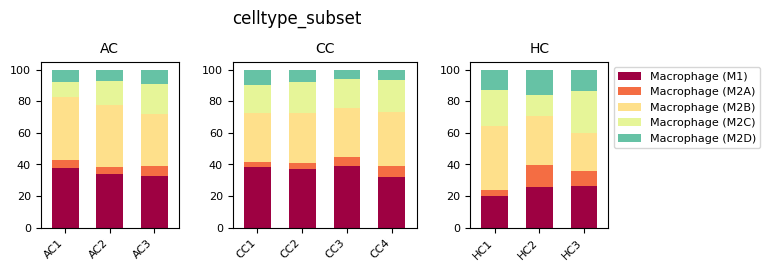

In [ ]:
## 특정 세포유형의 subset별 상대비율을 얻기 위해 특정 세포 유형만 선택
## 이 경우 Macrophage subset의 상대비율을 보기 위해 먼저 minor type이 macrophage인 cell들만 선택
b = adata_t.obs['celltype_minor'] == 'Macrophage'
adata_s = adata_t[b,:]

## 샘플별로 macrophage subset의 개수와 상대비율을 얻어서 데이터프레임에 저장
col = 'celltype_subset'
df_cnt, df_pct= get_population_per_sample( adata_s, col, sort_by = [] )
display(df_cnt)

plot_population_grouped( df_pct,
                        sort_by = [],
                         title = col,
                         title_fs = 12,
                         title_y_pos = 1.2,
                         label_fs = 10,
                         bar_width = 0.6,
                         tick_fs = 8,
                         xtick_rot = 45,
                         xtick_ha = 'right',
                         legend_fs = 8,
                         legend_loc = 'upper left',
                         bbox_to_anchor = (1,1),
                         legend_ncol = 1,
                         cmap = None,
                         figsize=(7, 2),
                         wspace = 0.35,
                         dpi = 100)

In [ ]:
## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

df_res = test_group_diff( df_pct, ref_group = None, pval_cutoff = 0.1 )
display(df_res)

,CC_vs_AC,HC_vs_AC,HC_vs_CC
Macrophage (M2D),0.660929,0.010718,0.006113
Macrophage (M1),0.434986,0.015751,0.007507


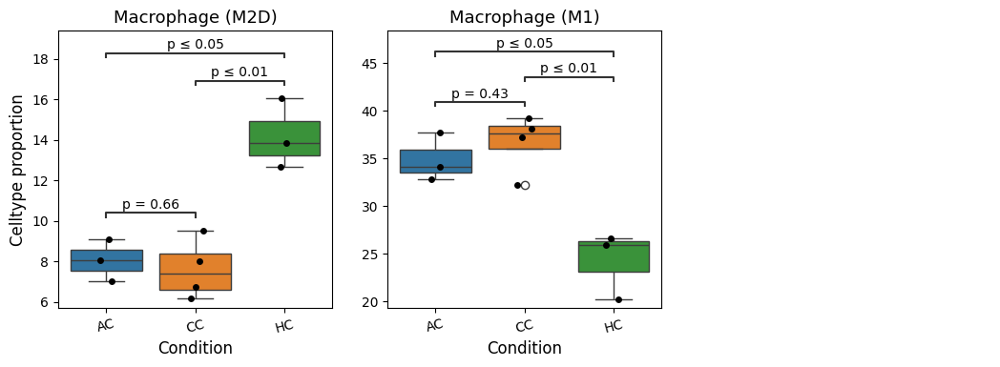

In [ ]:
## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel],
                 df_pct['Group'],
                 ylabel = 'Celltype proportion',
                 ncols = 3,
                 figsize = (3.5,3.5),
                 dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None,
                 title_y_pos = 1.05,
                 title_fs = 15,
                 label_fs = 12,
                 tick_fs = 10,
                 xtick_rot = 15,
                 annot_ref = None,
                 annot_fmt = 'simple',
                 annot_fs = 10,
                 ws_hs = (0.2, 0.25),
                 stripplot = True,
                 stripplot_ms = 5,
                 cmap = 'tab10')

### __B. CNV & tumor cell identification 결과__
#### <font color=blue>(This works only if you checked "Tumor cell Identification" box when running SCODA)</font>

- __InferCNV:__ https://github.com/broadinstitute/infercnv
- __InferCNVpy:__ https://infercnvpy.readthedocs.io/en/latest/infercnv.html
- __InferPloidy:__ https://github.com/combio-dku/InferPloidy

#### __B.1 Inspecting CNV estimates using heatmap__
- We first group the cells into appropriate groups
- then compare the CNV patterns of the resulting cell groups using a heatmap.

In [ ]:
## adata_t의 사본을 만들어서 adata에 저장
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음
adata = adata_t[:,:].copy()

## cell들을 Grouping 하기 위해 obs 필드에 'cell_group' 열을 새로 정의
## 기본적으로 major type의 이름을 사용
adata.obs['cell_group'] = adata.obs['celltype_major'].astype(str).copy(deep = True)
adata.obs['cell_group'] = adata.obs['cell_group'].replace(rename_dict['celltype_major'])

## condition 열에 정의된 유방암 subtype에 따라 암세포로 식별된 세포들의
## 이름에 유방암 subtype을 추가하여 이름 변경
b = adata.obs['ploidy_dec'] == 'Aneuploid'
adata.obs.loc[b, 'cell_group'] = 'Aneuploid ' + adata.obs.loc[b, 'condition'].astype(str) \
                               + ' ' + adata.obs.loc[b, 'cell_group']

## 'cell_group'열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd = plot_cnv( adata, groupby = 'cell_group', N_cells_min = 200,
                title = 'log2(CNR)', title_fs = 12, title_y_pos = 1.1,
                label_fs = 12, tick_fs = 11,
                figsize = (15, 8), swap_axes = False,
                var_group_rotation = 90, cmap='RdBu_r', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

#### __B.2 Comparison of CNV patterns across samples using only cells identified as tumor cells__

In [ ]:
b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

cell_grouping = 'sample_ext_for_deg'

## cell_grouping열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd, cna_res = plot_cnv( adata_s, groupby = cell_grouping, N_cells_min = 200,
                title = None, title_fs = 12, title_y_pos = 1.1,
                label_fs = 12, tick_fs = 10, Ns_min = 4, show_cna_spots = True,
                figsize = (15, 10), swap_axes = False,
                var_group_rotation = 90, cmap='bwr', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

In [ ]:
axes = plot_cnv_hit( cna_res['cnv_peaks_pos'], title = None, title_fs = 13,
                     label_fs = 12, tick_fs = 10, wspace = 0.1,
                     dpi = 150, ylabel = 'Genomic region',
                     bin_size = 0.22, cmap = 'Blues')

cna_res['genes']

#### __B.3 Finding genomic spots where CNV has a peak__

In [ ]:
## Select cells of interest
b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

cnv_peaks = find_genomic_spots_of_cnv_peaks( adata_s, group_col = 'condition', width = 5, std_scale = 5, q = None )
cnv_peaks

#### __B.4 Visualizing CNV patterns using UMAP projection__

In [ ]:
# adata = adata_t[:,:]

sc.pp.neighbors(adata, n_neighbors=10, n_pcs=10, use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')
ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']

In [ ]:
items_to_plot = ['condition', 'celltype_major', 'cnv_ref_ind', 'ploidy_dec', 'sample']

adata.obs['cnv_ref_ind'] = adata.obs['cnv_ref_ind'].astype(str)
adata.obs['tumor_origin_ind'] = adata.obs['tumor_origin_ind'].astype(str)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.35, legend_fontsize = 10,
                       ncols = 2, palette = 'Spectral', return_fig = False,
                       add_outline = True)

#### __B.5  Inspecting aneuploid/diploid cell population__

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
b = adata_t.obs['tumor_origin_ind']
adata_s = adata_t[b,:]

col = 'ploidy_dec'
df_cnt, df_pct= get_population_per_sample( adata_s, col, sort_by = [] )

plot_population_grouped( df_pct, sort_by = ['Aneuploid'], bar_width = 0.6,
                 title = None, title_fs = 10, title_y_pos = 1.15, dpi = 120,
                 label_fs = 9, tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
                 legend_fs = 8, legend_loc = 'upper left', bbox_to_anchor = (1,1),
                 legend_ncol = 1, cmap = None, figsize=(6, 1), wspace = 0.35)

### __C. Cell-cell interaction analysis results__
- __CellPhoneDB:__ https://www.cellphonedb.org/

#### __C.1 Structure and format of the cell–cell interaction results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1091cGa6DqKSybzWSd6YE7amC2HDqNIn6" align="center" width="320"/>
</div>

<div>
<img src=attachment:48abf5fd-8f00-4f14-9a91-bb5b872d7275.png width="320"/>   
</div>

- The CCI results are stored separately for each sample and each condition.
- The data format is consistent between the two result types.
- For condition-level CCI, only interactions that are commonly observed in a certain percentage of samples within the condition are retained.

In [ ]:
show_tree(adata_t.uns['CCI'], max_depth = 3, n_to_show = 3)

In [ ]:
show_tree(adata_t.uns['CCI_sample'], max_depth = 3, n_to_show = 3)

In [ ]:
## Condition 별 CCI 결과 항목들 확인
adata_t.uns['CCI'].keys()

dict_keys(['AC', 'CC', 'HC'])

In [ ]:
## 샘플 별 CCI 결과 항목들 확인
adata_t.uns['CCI_sample'].keys()

In [ ]:
## CCI results in a data frame
adata_t.uns['CCI_sample']['CC1']

#### __C.2 Inspecting condition-specific CCIs__

9 cell_pairs, 101 gene_pairs found


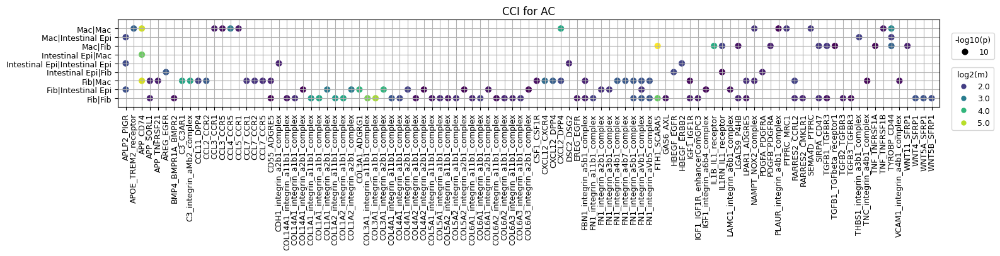

9 cell_pairs, 101 gene_pairs found


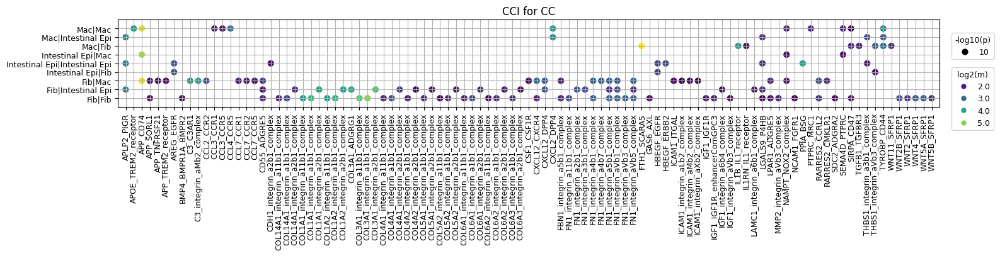

9 cell_pairs, 101 gene_pairs found


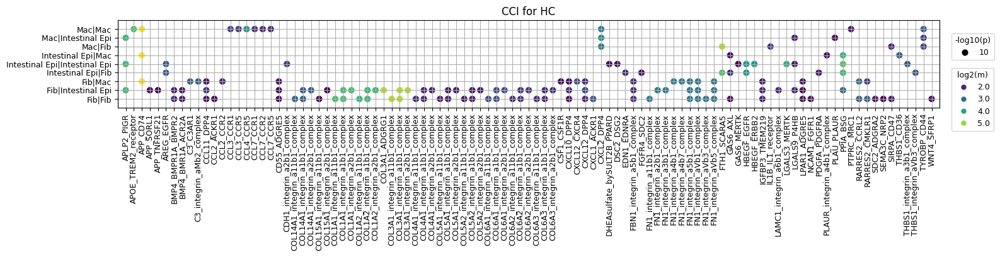

In [ ]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Intestinal Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

## Retreive celltype abbreviations
rename_dict = get_abbreviations()

ax = plot_cci_dot( adata_t.uns['CCI'],
                   n_gene_pairs = 100,
                   target_cells = target_cells,
                   target_genes = target_genes,
                   pval_cutoff = 0.1,
                   mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None,
                   title_fs = 12,
                   legend_fs = 9,
                   legend_mkr_sz = 9,
                   tick_fs = 9,
                   xtick_rot = 90,
                   xtick_ha = 'center',
                   dpi = 100,
                   swap_ax = True,
                   cmap = None )

#### __C.3 Exploring CCis associated with a specific gene set__  

In [ ]:
b1 = adata_t.var_names.str.startswith('Ccl')
b2 = adata_t.var_names.str.startswith('Cxcl')
b3 = adata_t.var_names.str.startswith('Il')

genes_sel = list(adata_t.var.index.values[b1 | b2 | b3])
np.array(genes_sel)

array(['Il17a', 'Il17f', 'Il1r2', 'Il1r1', 'Il1rl2', 'Il1rl1', 'Il18r1',
       'Il18rap', 'Ccl20', 'Ilkap', 'Il24', 'Il19', 'Il10', 'Ildr2',
       'Il2ra', 'Il15ra', 'Il1f9', 'Il1f6', 'Il1rn', 'Il1a', 'Il1b',
       'Il1bos', 'Il7', 'Il2', 'Il21', 'Il12a', 'Il6ra', 'Ilf2',
       'Il11ra1', 'Ccl27a', 'Ccl19', 'Ccl21a', 'Il22ra1', 'Il6', 'Cxcl5',
       'Cxcl3', 'Cxcl1', 'Cxcl2', 'Cxcl9', 'Cxcl10', 'Cxcl13', 'Il31',
       'Ccl24', 'Il12rb2', 'Il23r', 'Il5ra', 'Il17re', 'Il17rc', 'Cxcl12',
       'Il17ra', 'Il11', 'Cxcl17', 'Il4i1', 'Il16', 'Il18bp', 'Ilk',
       'Il4ra', 'Il21r', 'Il27', 'Ccl25', 'Il12rb1', 'Il15', 'Il27ra',
       'Ccl22', 'Ccl17', 'Il34', 'Il17c', 'Ilf3', 'Il10ra', 'Il18',
       'Il20rb', 'Il22ra2', 'Il20ra', 'Ilvbl', 'Il22', 'Iltifb', 'Il23a',
       'Il9r', 'Il12b', 'Il4', 'Il13', 'Il5', 'Cxcl16', 'Ccl2', 'Ccl7',
       'Ccl11', 'Ccl12', 'Ccl8', 'Ccl1', 'Ccl5', 'Ccl9', 'Ccl6', 'Ccl3',
       'Ccl4', 'Cxcl14', 'Il6st', 'Il31ra', 'Ccl28', 'Il3ra', 'Il17rd',
     

7 cell_pairs, 25 gene_pairs found


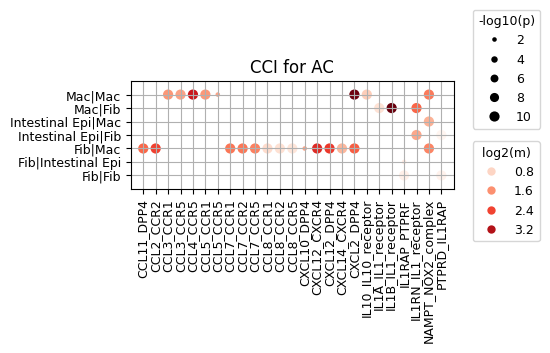

8 cell_pairs, 26 gene_pairs found


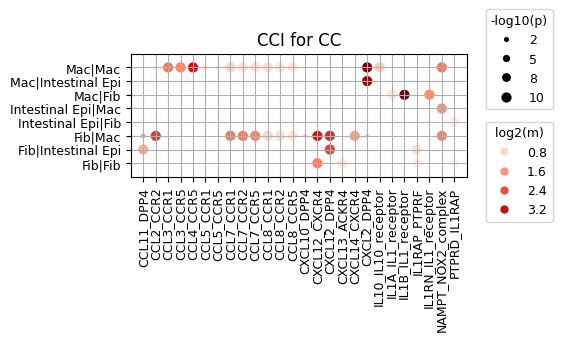

8 cell_pairs, 24 gene_pairs found


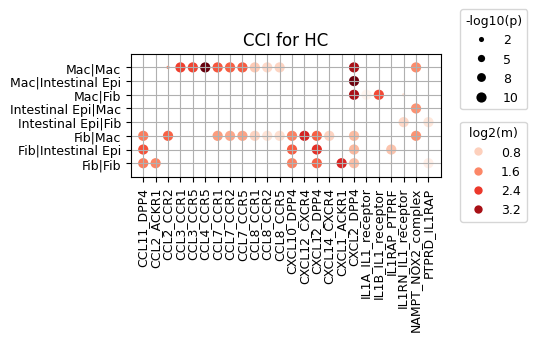

In [ ]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Intestinal Epithelial cell', 'Macrophage', 'Fibroblast']

## CellPhoneDB는 인간 유전자 이름만 사용하므로 마우스의 경우 유전자 이름을 대문자로 변경 필요.
target_genes = [g.upper() for g in genes_sel] + ['NAMPT']

## Retreive celltype abbreviations
rename_dict = get_abbreviations()

ax = plot_cci_dot( adata_t.uns['CCI'],
                   n_gene_pairs = 60,
                   target_cells = target_cells,
                   target_genes = target_genes,
                   pval_cutoff = 0.1,
                   mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None,
                   title_fs = 12,
                   legend_fs = 9,
                   legend_mkr_sz = 9,
                   tick_fs = 9,
                   xtick_rot = 90,
                   xtick_ha = 'center',
                   dpi = 100,
                   swap_ax = True,
                   cmap = 'Reds')

#### __C.4 Inspecting per-sample CCIs__

In [ ]:
cci_df_dct = adata_t.uns['CCI_sample']

## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Intestinal Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

## Retreive celltype abbreviations
rename_dict = get_abbreviations()

ax = plot_cci_dot( adata_t.uns['CCI_sample'],
                   n_gene_pairs = 60,
                   target_cells = target_cells,
                   target_genes = target_genes,
                   pval_cutoff = 0.1,
                   mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None,
                   title_fs = 12,
                   legend_fs = 9,
                   legend_mkr_sz = 9,
                   tick_fs = 9,
                   xtick_rot = 90,
                   xtick_ha = 'center',
                   dpi = 100,
                   swap_ax = True,
                   cmap = 'Reds')

#### __C.5 Statistical test for condition-specific differences in CCI strength__
샘플별 CCI 결과에서 모든 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [ ]:
target_cells = ['Intestinal Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( adata_t,
                    cci_idx_lst = None,
                    cells = target_cells,
                    genes = target_genes,
                    pval_cutoff = 0.05 )
## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

df_res = test_group_diff( df,
                          ref_group = None,
                          pval_cutoff = 0.05 )
df_res

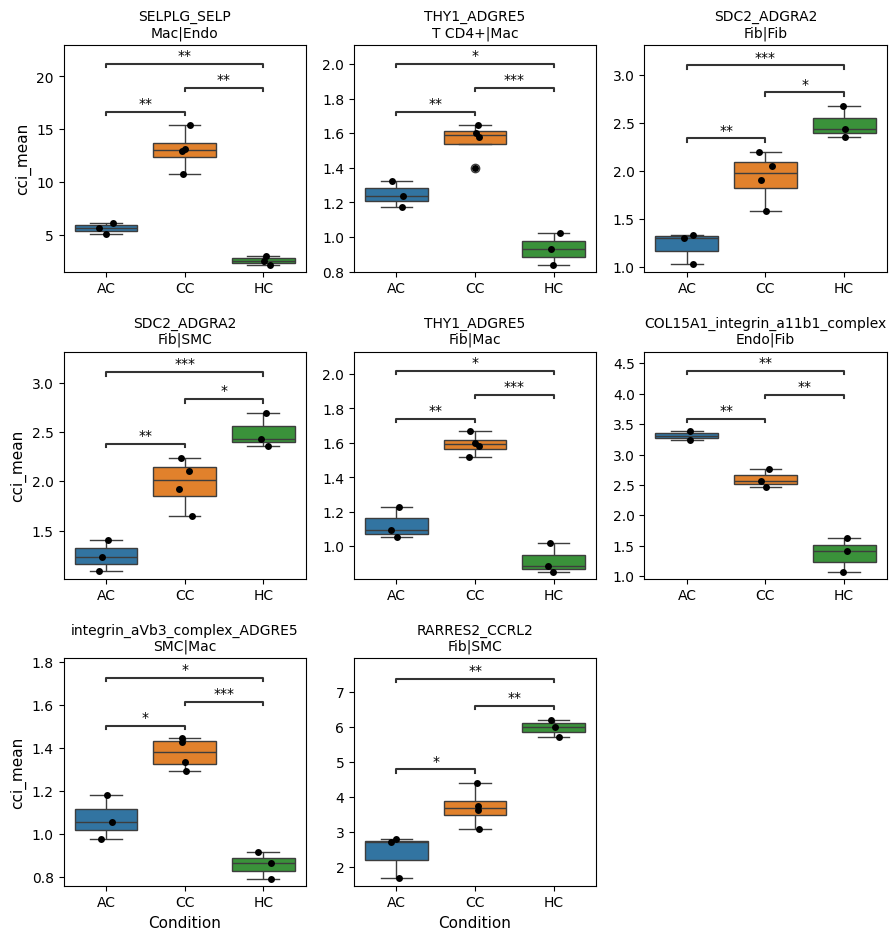

In [ ]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Retreive celltype abbreviations
    rename_dict = get_abbreviations()

    plot_pct_box( df[idx_sel],
                  df['Group'],
                  ylabel = 'cci_mean',
                  ncols = 3,
                  figsize = (3,3),
                  dpi = 100,
                  rename_cells = rename_dict['celltype_minor'],
                  title = None,
                  title_y_pos = 1.05,
                  title_fs = 12,
                  label_fs = 11,
                  tick_fs = 10,
                  xtick_rot = 0,
                  xtick_ha = 'center',
                  annot_ref = None,
                  annot_fmt = 'star',
                  annot_fs = 10,
                  ws_hs = (0.2, 0.35),
                  stripplot = True,
                  stripplot_ms = 5)

#### __C.6 Statistical test for condition-specific differences in CCI strength (specifying genes to consider)__
샘플별 CCI 결과에서 여러 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [ ]:
target_cells = ['Intestinal Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = ['IL1B', 'NAMPT', 'CYBB', 'CYBA', 'NFKB1']

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( adata_t,
                    cci_idx_lst = None,
                    cells = target_cells,
                    genes = target_genes,
                    pval_cutoff = 0.1 )

## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

deg_ref_cond = adata_t.uns['analysis_parameters']['DEG_REF_GROUP']
df_res = test_group_diff( df,
                          ref_group = deg_ref_cond,
                          pval_cutoff = 0.1,
                          equal_var = True )
df_res

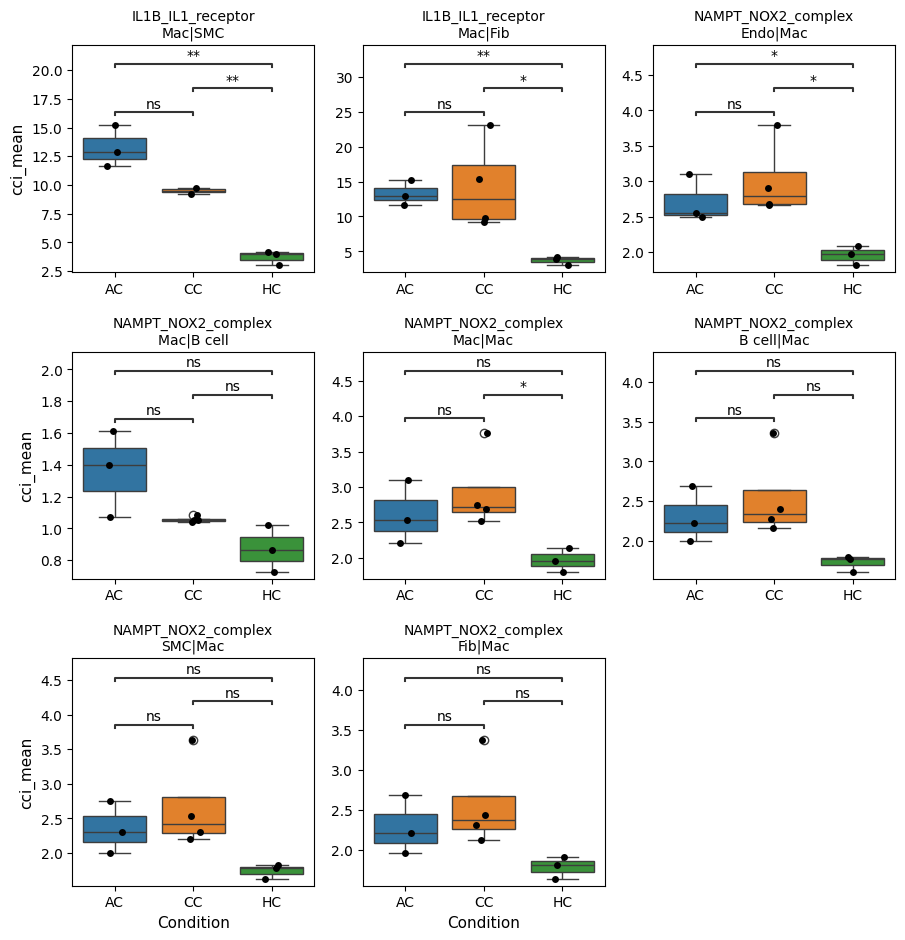

In [ ]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Retreive celltype abbreviations
    rename_dict = get_abbreviations()

    plot_pct_box( df[idx_sel],
                  df['Group'],
                  ylabel = 'cci_mean',
                  ncols = 3,
                  figsize = (3,3),
                  dpi = 100,
                  rename_cells = rename_dict['celltype_minor'],
                  title = None,
                  title_y_pos = 1.05,
                  title_fs = 12,
                  label_fs = 11,
                  tick_fs = 10,
                  xtick_rot = 0,
                  xtick_ha = 'center',
                  annot_ref = None,
                  annot_fmt = 'star',
                  annot_fs = 10,
                  ws_hs = (0.2, 0.35),
                  stripplot = True,
                  stripplot_ms = 5)

#### __C.7 Circle plots for an overview of cell-cell interactions__

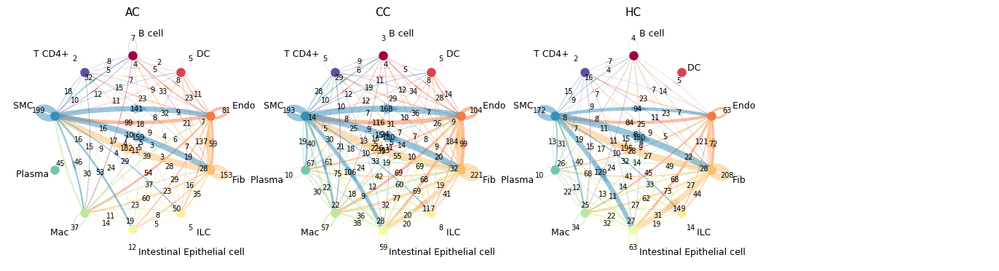

In [ ]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
plot_cci_circ_group( adata_t.uns['CCI'],
                     target = None,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False,
                     ncol = 4,
                     figsize = (3.5,3.5),
                     title = None,
                     title_y_pos = 1.1,
                     title_fs = 24,
                     text_fs = 9,
                     num_fs = 7,
                     margin = 0.08,
                     dpi = 100,
                     alpha = 0.5,
                     R_curvature = 3,
                     linewidth_max = 8,
                     linewidth_log = False,
                     node_size = 8,
                     rot = False,
                     cmap = 'Spectral',
                     wspace = 0.15,
                     hspace = 0.1 )

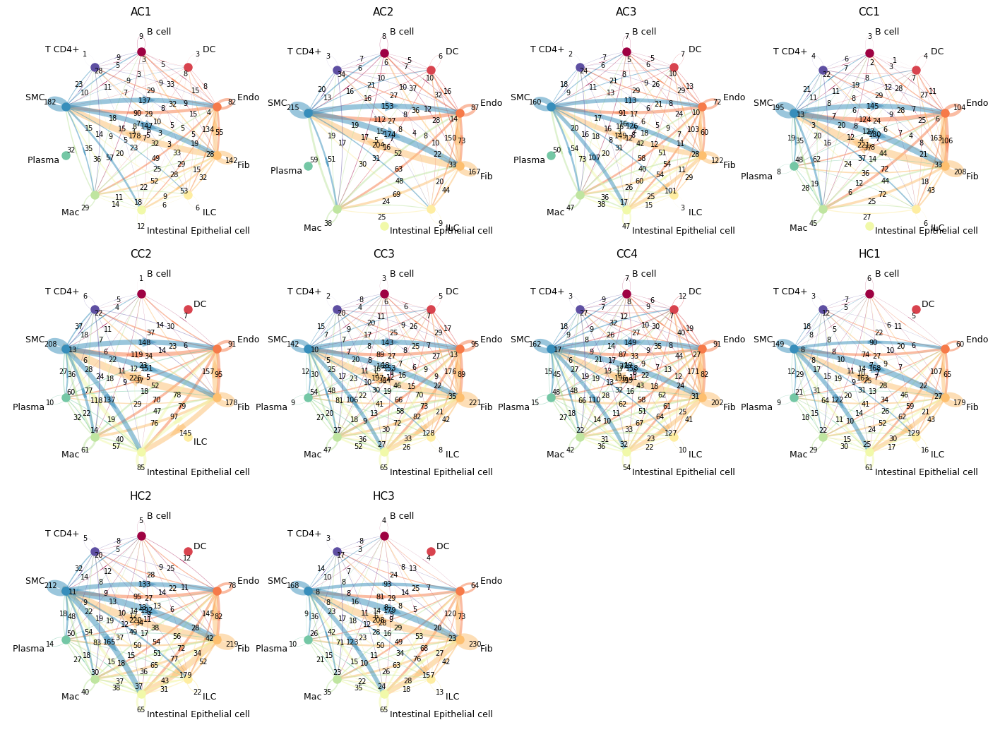

In [ ]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
plot_cci_circ_group( adata_t.uns['CCI_sample'],
                     target = None,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False,
                     ncol = 4,
                     figsize = (3.5,3.5),
                     title = None,
                     title_y_pos = 1.1,
                     title_fs = 24,
                     text_fs = 9,
                     num_fs = 7,
                     margin = 0.08,
                     dpi = 100,
                     alpha = 0.5,
                     R_curvature = 3,
                     linewidth_max = 8,
                     linewidth_log = False,
                     node_size = 8,
                     rot = False,
                     cmap = 'Spectral',
                     wspace = 0.15,
                     hspace = 0.1 )

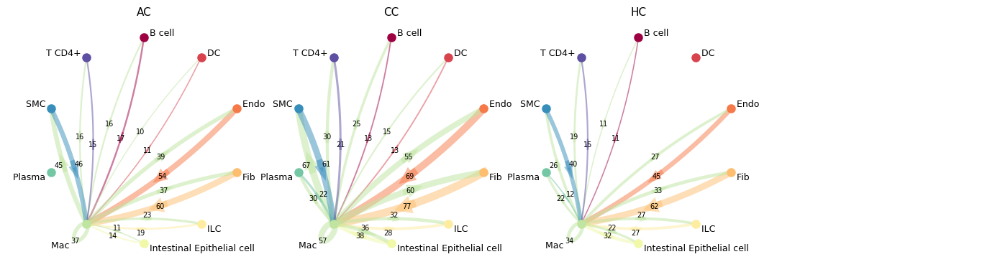

In [ ]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
## 특정 세포유형을 중심으로 CCI 개수 확인 (이 경우 Epithelial cell을 중심으로 봄)
target = ['Mac']

plot_cci_circ_group( adata_t.uns['CCI'],
                     target = target,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False,
                     ncol = 4,
                     figsize = (3.5,3.5),
                     title = None,
                     title_y_pos = 1.1,
                     title_fs = 24,
                     text_fs = 9,
                     num_fs = 7,
                     margin = 0.08,
                     dpi = 100,
                     alpha = 0.5,
                     R_curvature = 3,
                     linewidth_max = 8,
                     linewidth_log = False,
                     node_size = 8,
                     rot = False,
                     cmap = 'Spectral',
                     wspace = 0.15,
                     hspace = 0.1 )

### __D. DEG analysis results and marker/target discovery__

In [ ]:
show_tree(adata_t, max_depth = 2, n_to_show = 3)

#### __D.1 Structure and format of the DEG results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1N-XeRpAvUAlnuryLpll7sYyzGbKGK5eG" align="center" width="500"/>
</div>

<div>
<img src=attachment:f57fafbd-8253-4210-88ed-9acbc3224d08.png width="500"/>   
</div>

- The DEG results are processed and stored separately for each cell type.
- The cell type level to be used—major, minor, or subset—can be specified in the analysis_parameters when running SCODA.
- The current results are based on the celltype_minor level and reflect condition-specific DEGs identified for each cell type.

In [ ]:
show_tree(adata_t.uns['DEG'], max_depth = 3, n_to_show = 3)

In [ ]:
show_tree(adata_t.uns['DEG_vs_ref'], max_depth = 3, n_to_show = 3)

In [ ]:
## 어떤 세포 유형들에 대한 DEG 결과가 있는지 확인
adata_t.uns['DEG'].keys()

## analysis_parameters에 정의한 DEG분석을 위한 최소 셀수(MIN_NUM_CELLS_FOR_DEG)보다
## 적은 셀수를 갖는 세포 유형에 대해서는 DEG 분석이 수행 되지 않음.
## (각 조건 별로 해당 유형의 셀수가 최소한 MIN_NUM_CELLS_FOR_DEG 정도되어야 DEG 분석이 수행됨)

In [ ]:
## Epithelial cell에 대한 DEG 결과에 어떤 것들이 있는지 확인
adata_t.uns['DEG']['Intestinal Epithelial cell'].keys()

In [ ]:
## Epithelial cell에 대한 DEG 결과에 어떤 것들이 있는지 확인
adata_t.uns['DEG']['Intestinal Epithelial cell']['CC_vs_others']

- nz_pct_score = nz_pct_test*(1-nz_pct_ref)
- nz_pct_test: percentage of cells with the gene expressed in test group
- nz_pct_ref: percentage of cells with the gene expressed in reference group

In [ ]:
adata_t.uns['DEG_stat']['Intestinal Epithelial cell']

#### __D.2 Gene ranking per celltype__

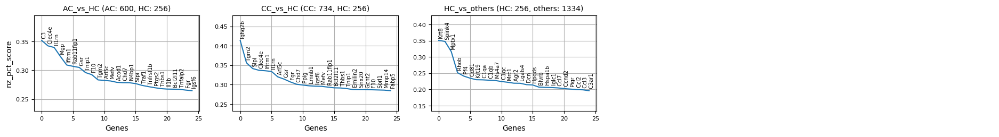

In [ ]:
target_cell = 'Macrophage'

n_genes_to_show = 25

plot_deg( adata_t.uns['DEG_vs_ref'][target_cell],
          reference = 'nz_pct_score',
          n_genes_to_show = n_genes_to_show,
          pval_cutoff = 0.01,
          figsize = (4,2),
          dpi = 100,
          text_fs = 7,
          title_fs = 10,
          label_fs = 10,
          tick_fs = 8,
          ncols = 5,
          wspace = 0.2,
          hspace = 0.5,
          deg_stat_dct = adata_t.uns['DEG_vs_ref_stat'][target_cell],
          show_log_pv = False )


In [ ]:
n_genes_to_show = 25

for key in adata_t.uns['DEG_vs_ref'].keys():

    print(key)
    plot_deg( adata_t.uns['DEG_vs_ref'][key],
              reference = 'nz_pct_score',
              n_genes_to_show = n_genes_to_show,
              pval_cutoff = 0.01,
              figsize = (4,2),
              dpi = 100,
              text_fs = 7,
              title_fs = 10,
              label_fs = 10,
              tick_fs = 8,
              ncols = 5,
              wspace = 0.2,
              hspace = 0.5,
              deg_stat_dct = adata_t.uns['DEG_vs_ref_stat'][key],
              show_log_pv = False )



#### __D.3 Discovery of condition-specific markers (per-celltype)__

In [ ]:
# target_cell = 'Fibroblast'
# target_cell = 'Macrophage'
# target_cell = 'Ductal cell'
target_cell = 'Macrophage'

mkr_dict, df_deg_dct_updated = find_condition_specific_markers(
                                            adata_t.uns['DEG_vs_ref'][target_cell],
                                            score_col = 'nz_pct_score',
                                            n_markers_max = 60,
                                            score_cutoff = 0.15,
                                            pval_cutoff = 0.05,
                                            nz_pct_fc_cutoff = 1.25,
                                            surfaceome_only = True,
                                            verbose = True )

## Print results
for key in mkr_dict.keys():
    mkr_dict[key].sort()
    print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])

N_markers: 
   AC_vs_HC (7711 -> 94) 
   CC_vs_HC (7842 -> 158) 
   HC_vs_others (7763 -> 10)
N_markers_selected: AC (60), CC (60), HC (10)
AC (60):  ['Adam17', 'Adam8', 'Adora2a', 'Adora2b', 'App', 'Atp1b3', 'Atp2b4', 'Ccr2', 'Ccr7', 'Cd274', 'Cd40', 'Cd80', 'Clec2d', 'Csf2rb', 'Emb', 'Emp1', 'Fcgr2b', 'Furin', 'Gpr132', 'Gpr137b', 'Gpr35', 'Ifnar1', 'Ifngr2', 'Igsf6', 'Il10ra', 'Il1r2', 'Il2rg', 'Itga5', 'Itgal', 'Itgam', 'Itgb2', 'Ldlr', 'Lrp1', 'Lrp10', 'Lrrc25', 'Mmp14', 'Nrg1', 'Nrros', 'Plaur', 'Plxnd1', 'Ptafr', 'Ptprj', 'Pvr', 'Rnf149', 'Selplg', 'Sema4d', 'Sirpa', 'Slc15a3', 'Slc8b1', 'Sorl1', 'Sppl2a', 'Ssr1', 'Tcirg1', 'Tlr2', 'Tm9sf3', 'Tmem123', 'Tnfrsf1a', 'Tnfrsf1b', 'Trem1', 'Tspan13']
CC (60):  ['Adam10', 'Adam17', 'Adam8', 'App', 'Atp1b3', 'Ccr1', 'Ccr2', 'Cd274', 'Cd300ld', 'Cd80', 'Clec2d', 'Csf2rb', 'Emb', 'Fcgr2b', 'Furin', 'Gpr132', 'Gpr137b', 'Gpr35', 'Havcr2', 'Ifnar1', 'Ifnar2', 'Ifngr1', 'Ifngr2', 'Igsf6', 'Il10ra', 'Il1r2', 'Il2rg', 'Itga4', 'Itga5', 'Itgal

Num markers selected: 60 -> 60


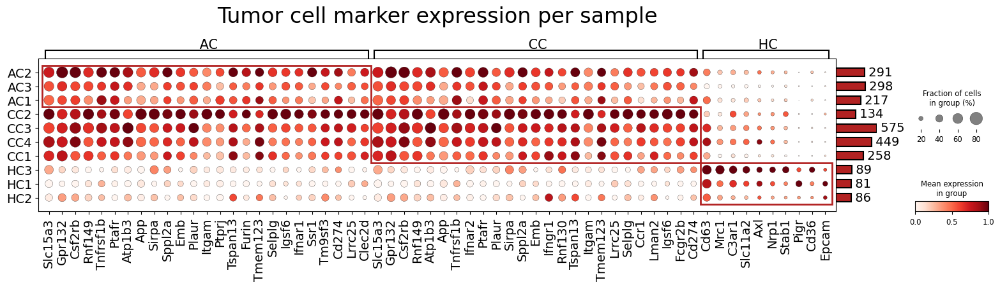

In [ ]:
mkr_dict_updated = plot_marker_exp( adata_t,
                                    markers = mkr_dict,
                                    celltype_selection = 'Macrophage',
                                    N_cells_per_group_min = 40,
                                    N_markers_per_group_max = 25,
                                    N_markers_total = 140,
                                    title = 'Tumor cell marker expression per sample',
                                    title_y_pos = 2,
                                    title_fs = 24,
                                    text_fs = 14,
                                    var_group_height = 1.2,
                                    var_group_rotation = 0,
                                    standard_scale = 'var',
                                    nz_frac_max = 0.8,
                                    nz_frac_cutoff = 0.05,
                                    rem_mkrs_common_in_N_groups_or_more = 3,
                                    legend = True,
                                    figsize = None,
                                    swap_ax = False,
                                    add_rect = True,
                                    cmap = 'Reds',
                                    linewidth = 2,
                                    linecolor = 'firebrick' )

#### __D.4 Examining expression patterns of selected markers using violin plots__

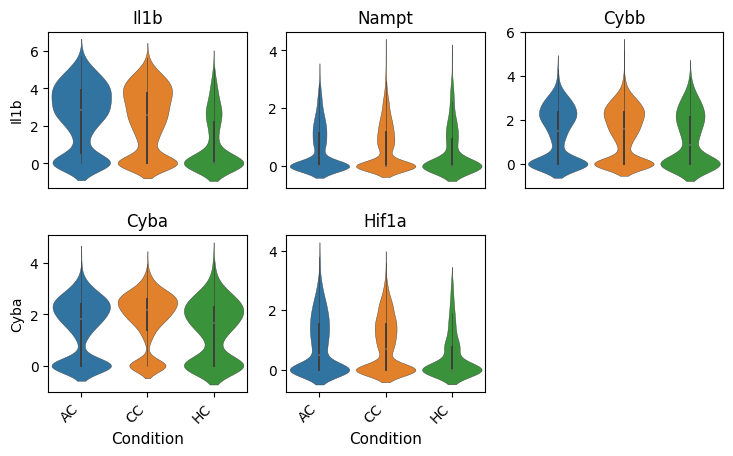

In [ ]:
items_to_plot = ['Il1b', 'Nampt', 'Cybb', 'Cyba', 'Hif1a']

b = adata_t.obs['celltype_minor'] == 'Macrophage'
adata_s = adata_t[b,:]

## RNA Expression의 log변환 값을 기준으로 violin plot을 확인
sc.pp.normalize_total(adata_s, target_sum=1e4)
sc.pp.log1p(adata_s)

df = adata_s[:, items_to_plot].to_df()
df['group'] = adata_s.obs['condition']

plot_violin( df,
             genes_lst = items_to_plot,
             group_col = 'group',
             scale = 'width',
             group_order = None,
             inner = 'box',
             width = 0.9,
             linewidth = 0.3,
             bw = 'scott',
             figsize = (2.5,2),
             dpi = 100,
             text_fs = 10,
             title = None,
             title_fs = 14,
             title_y_pos = 1,
             label_fs = 11,
             tick_fs = 10,
             xtick_rot = 45,
             xtick_ha = 'right',
             ncols = 3,
             wspace = 0.2,
             hspace = 0.3,
             cmap = 'tab10' )

#### __D.5 Statistical test for mean-expression of condition-specific markers__
- 요부분은 sample 별 Gene expression의 평균이 조건별로 유의하게 차이가 나는지 확인하는 부분입니다. (위 코드셀의 결과가 사용됩니다)
- 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고 sample이 많을 수록 통계적 유의성이 커짐. (p-value가 작아짐)

In [ ]:
target_genes = []

b = adata_t.obs['celltype_minor'] == 'Macrophage'
adata_s = adata_t[b,:]

## RNA Expression의 log변환 값을 기준으로 violin plot을 확인
sc.pp.normalize_total(adata_s, target_sum=1e4)
sc.pp.log1p(adata_s)

df_all = get_gene_expression_mean( adata_s,
                                   genes = [],
                                   group_col = 'sample',
                                   nz_pct = True )
df_res = test_group_diff( df_all,
                         ref_group = None,
                          pval_cutoff = 0.001 )

with pd.option_context('display.max_rows', 20, 'display.min_rows', 20):
    display(df_res)

,CC_vs_AC,HC_vs_AC,HC_vs_CC
Gpr34,0.090279,0.000236,0.000126
Gdf9,0.231406,0.000199,0.000120
Clec4e,0.977023,0.000501,0.000293
Tle3,0.245837,0.000814,0.000821
Samhd1,0.028281,0.008291,0.000026
Ms4a6c,0.050171,0.006057,0.000026
Vmp1,0.013053,0.012731,0.000109
Snx12,0.000767,0.024657,0.001028
Pfn1,0.011340,0.066987,0.000026
Gpalpp1,0.092684,0.013061,0.000020


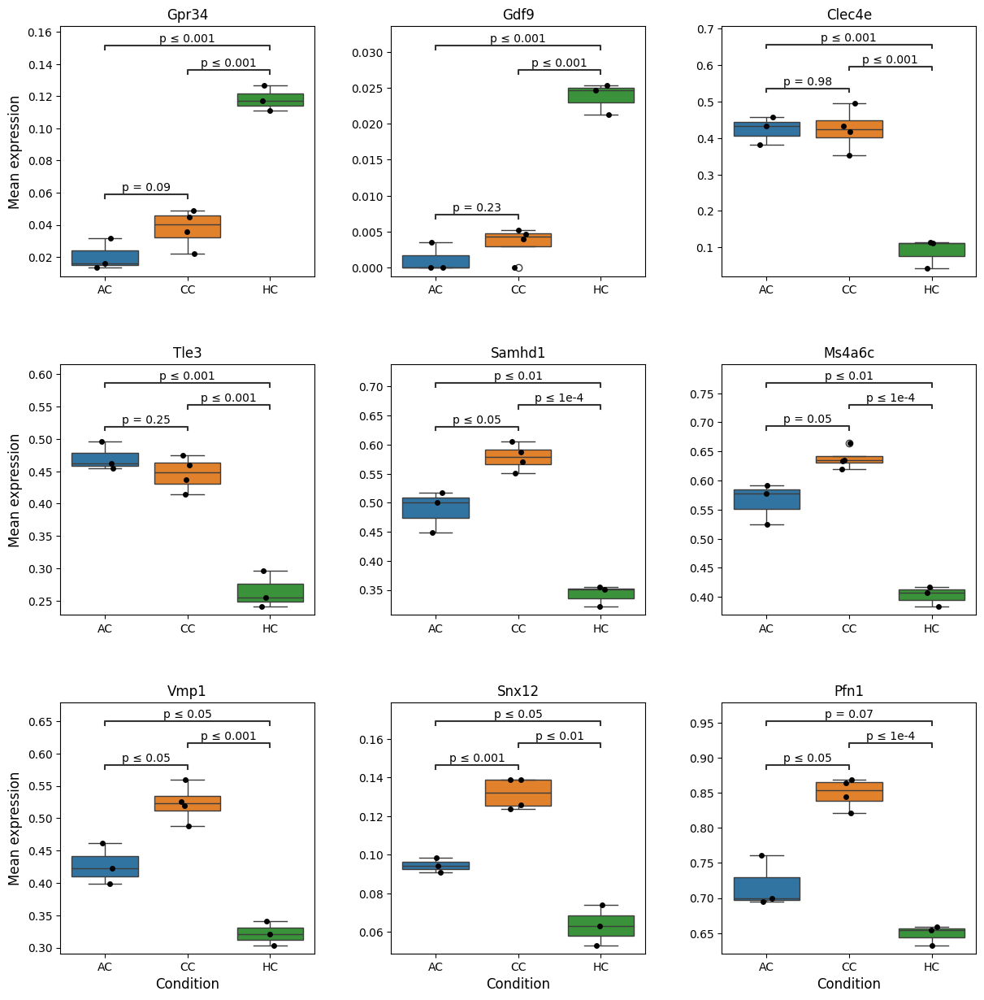

In [ ]:
## Show the first 9 genes
num_items_to_plot = 9
items_to_plot = df_res.iloc[:num_items_to_plot].index.values.tolist()

plot_pct_box( df_all[items_to_plot],
              df_all['Group'],
              ylabel = 'Mean expression',
              ncols = 3,
              figsize = (4,4),
              dpi = 100,
              title = None,
              title_y_pos = 1.05,
              title_fs = 14,
              label_fs = 12,
              tick_fs = 10,
              xtick_rot = 0,
              xtick_ha = 'center',
              annot_ref = None,
              annot_fmt = 'simple',
              annot_fs = 10,
              ws_hs = (0.3, 0.35),
              stripplot = True,
              stripplot_ms = 5 )

#### __D.6 Statistical test for mean-expression of some selected genes__


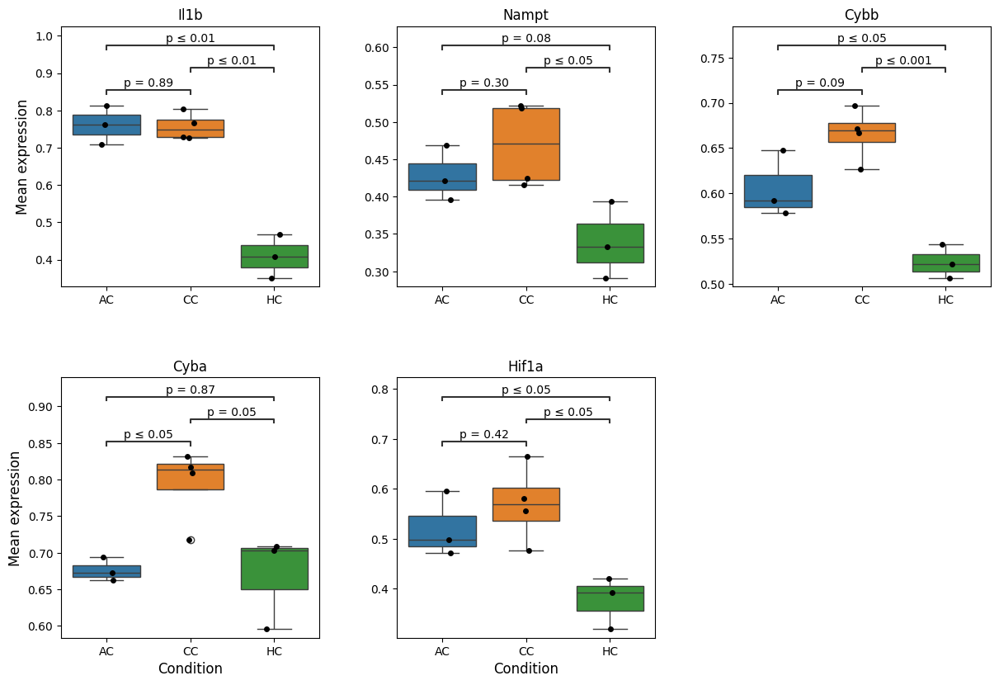

In [ ]:
b = adata_t.obs['celltype_minor'] == 'Macrophage'
adata_s = adata_t[b,:]

## RNA Expression의 log변환 값을 기준으로 violin plot을 확인
sc.pp.normalize_total(adata_s, target_sum=1e4)
sc.pp.log1p(adata_s)

df_all = get_gene_expression_mean( adata_s,
                                   genes = [],
                                   group_col = 'sample',
                                   nz_pct = True )

items_to_plot = ['Il1b', 'Nampt', 'Cybb', 'Cyba', 'Hif1a']

plot_pct_box( df_all[items_to_plot],
              df_all['Group'],
              ylabel = 'Mean expression',
              ncols = 3,
              figsize = (4,4),
              dpi = 100,
              title = None,
              title_y_pos = 1.05,
              title_fs = 14,
              label_fs = 12,
              tick_fs = 10,
              xtick_rot = 0,
              xtick_ha = 'center',
              annot_ref = None,
              annot_fmt = 'simple',
              annot_fs = 10,
              ws_hs = (0.3, 0.35),
              stripplot = True,
              stripplot_ms=5 )

### __E. Gene Set Aanalysis results__
- __GSEApy:__ https://github.com/zqfang/GSEApy

#### __E.1 Structure and format of the GSA/GSEA results__

##### __Structure of the GSA/GSEA results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1RrmkpkWCI1rcfW5cIBfKvip-lX3lkJRL" align="center" width="500"/>
</div>

<div>
<img src=attachment:1369afc9-25a8-4811-bc55-41e7c61309af.png width="500"/>   
</div>

- The GSA/GSEA results are processed and stored separately for each cell type.
- The results were based on the corresponding DEG results.

In [ ]:
show_tree(adata_t.uns['GSA_up'], max_depth = 3, n_to_show = 3)

Dictionary Structure (top-level):
├── B cell                    : (dict)
│    ├── AC_vs_others: DataFrame (145, 9), cols=[pval, pval_adj, genes, ... ])
│    ├── CC_vs_others: DataFrame (90, 9), cols=[pval, pval_adj, genes, ... ])
│    └── HC_vs_others: DataFrame (81, 9), cols=[pval, pval_adj, genes, ... ])
├── Dendritic cell            : (dict)
│    ├── AC_vs_others: DataFrame (27, 9), cols=[pval, pval_adj, genes, ... ])
│    └── CC_vs_others: DataFrame (5, 9), cols=[pval, pval_adj, genes, ... ])
├── Endothelial cell          : (dict)
│    ├── AC_vs_others: DataFrame (131, 9), cols=[pval, pval_adj, genes, ... ])
│    ├── CC_vs_others: DataFrame (119, 9), cols=[pval, pval_adj, genes, ... ])
│    └── HC_vs_others: DataFrame (59, 9), cols=[pval, pval_adj, genes, ... ])
├── Fibroblast                : (dict)
│    ├── AC_vs_others: DataFrame (29, 9), cols=[pval, pval_adj, genes, ... ])
│    ├── CC_vs_others: DataFrame (106, 9), cols=[pval, pval_adj, genes, ... ])
│    └── HC_vs_others: Data

In [ ]:
show_tree(adata_t.uns['GSA_vs_ref_up'], max_depth = 3, n_to_show = 3)

Dictionary Structure (top-level):
├── B cell                    : (dict)
│    ├── AC_vs_HC    : DataFrame (144, 9), cols=[pval, pval_adj, genes, ... ])
│    ├── CC_vs_HC    : DataFrame (123, 9), cols=[pval, pval_adj, genes, ... ])
│    └── HC_vs_others: DataFrame (61, 9), cols=[pval, pval_adj, genes, ... ])
├── Endothelial cell          : (dict)
│    ├── AC_vs_HC    : DataFrame (166, 9), cols=[pval, pval_adj, genes, ... ])
│    ├── CC_vs_HC    : DataFrame (155, 9), cols=[pval, pval_adj, genes, ... ])
│    └── HC_vs_others: DataFrame (44, 9), cols=[pval, pval_adj, genes, ... ])
├── Fibroblast                : (dict)
│    ├── AC_vs_HC    : DataFrame (96, 9), cols=[pval, pval_adj, genes, ... ])
│    ├── CC_vs_HC    : DataFrame (109, 9), cols=[pval, pval_adj, genes, ... ])
│    └── HC_vs_others: DataFrame (130, 9), cols=[pval, pval_adj, genes, ... ])
├── ILC                       : (dict)
│    ├── AC_vs_HC    : DataFrame (103, 9), cols=[pval, pval_adj, genes, ... ])
│    ├── CC_vs_HC    : 

##### __Format of a GSA result__

In [ ]:
adata_t.uns['GSA_up']['Intestinal Epithelial cell']['CC_vs_others'].head()

,pval,pval_adj,genes,overlap,pw_size,-log(p-val),-log(q-val),Term,Ind
AGE-RAGE signaling pathway in diabetic complications,0.005094,1.0,Plcb4;Akt3;Il1b;Bcl2;Mapk1;Plcd1;Cdc42;Pik3r2;...,20,101,2.292901,0.0,AGE-RAGE signaling pathway in diabetic complic...,1
AMPK signaling pathway,0.081963,1.0,Eef2;Akt3;Rab10;Fasn;Tbc1d1;Creb3;Adipor2;Pik3...,19,126,1.086380,0.0,AMPK signaling pathway,1
Acute myeloid leukemia,0.014111,1.0,Runx1;Bad;Hras;Akt3;Araf;Cebpa;Eif4ebp1;Pik3r2...,14,69,1.850443,0.0,Acute myeloid leukemia,1
Adherens junction,0.000487,1.0,Egfr;Csnk2a2;Actn1;Cdc42;Actb;Ctnnb1;Rac1;Mapk...,18,72,3.312382,0.0,Adherens junction,1
Adrenergic signaling in cardiomyocytes,0.015195,1.0,Atp2b1;Plcb4;Akt3;Atp2a2;Ppp1cb;Bcl2;Tpm3;Creb...,25,148,1.818305,0.0,Adrenergic signaling in cardiomyocytes,1


#### __E.2 Barplot visualization of condition-specific pathways activity__

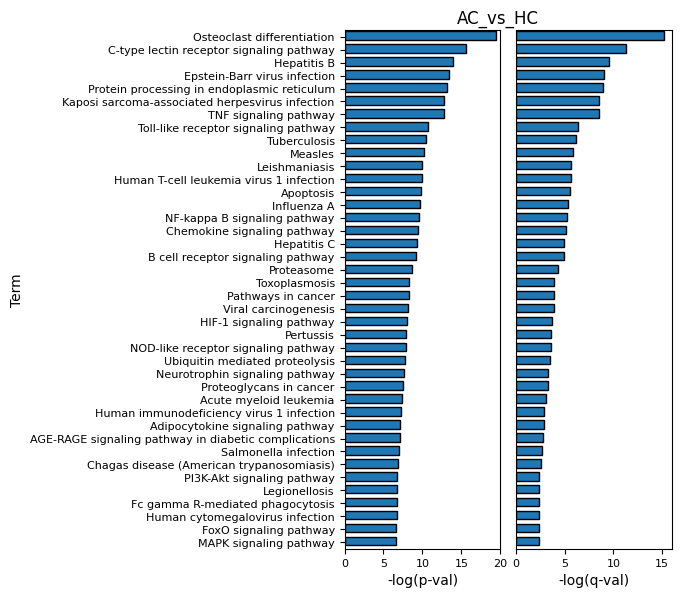

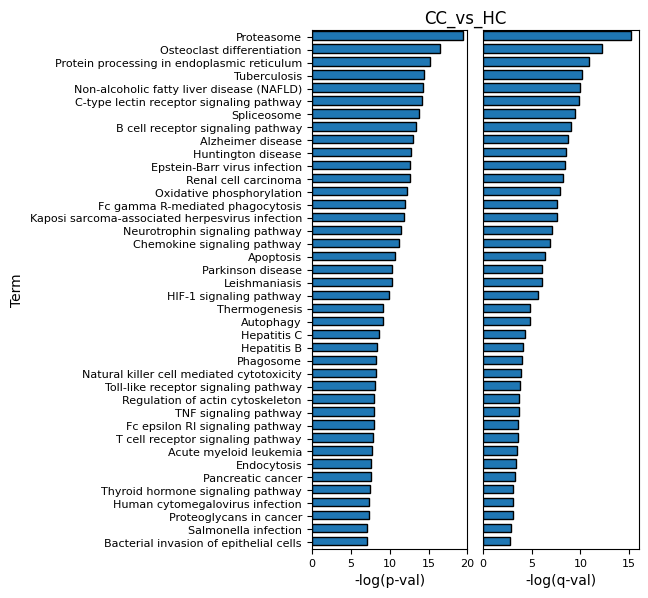

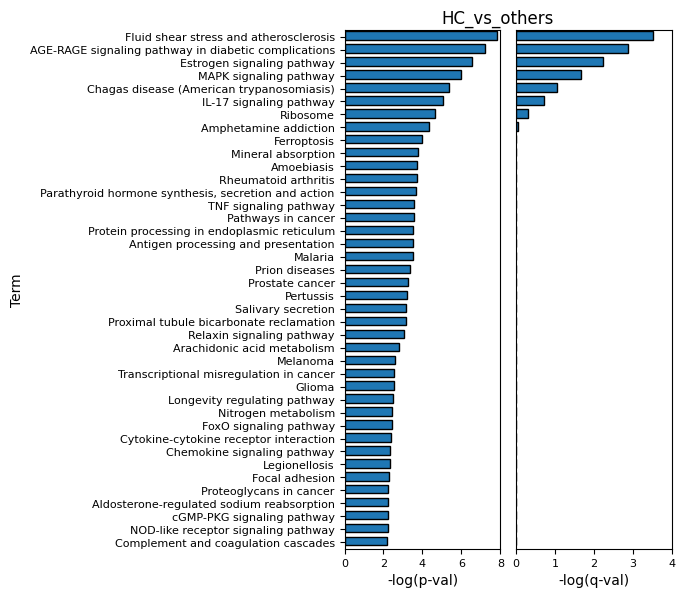

In [ ]:
target_cell = 'Macrophage'

df_sel_dct = plot_gsa_bar( adata_t.uns['GSA_vs_ref_up'][target_cell],
                           pval_cutoff = 0.05,
                           N_max_to_show = 40,
                           title = None,
                           bar_width = 0.8,
                           title_pos = (0.5, 1),
                           title_fs = 12,
                           title_ha = 'center',
                           label_fs = 10,
                           tick_fs = 8,
                           wspace=0.1,
                           hspace=0.25,
                           Ax = None,
                           facecolor = 'tab:blue',
                           edgecolor = 'black' )

#### __E.3 Dotplot visualization for an overview of condition-specific pathways activity__

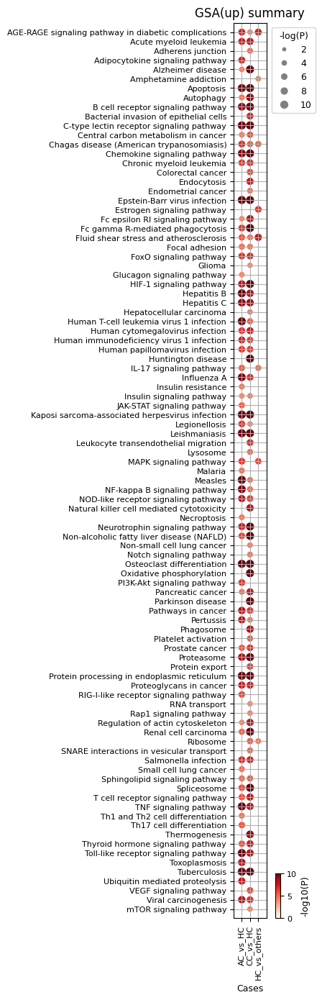

In [ ]:
target_cell = 'Macrophage'

plot_gsa_dot( adata_t.uns['GSA_vs_ref_up'][target_cell],
              pval_cutoff = 1e-4,
              title = 'GSA(up) summary',
              title_fs = 12,
              tick_fs = 8,
              xtick_rot = 90,
              xtick_ha = 'center',
              label_fs = 9,
              legend_fs = 9,
              swap_ax = False,
              figsize = None,
              dpi = 100,
              dot_size = 50,
              cbar_frac = 0.1,
              cbar_aspect = 10,
              cmap = 'Reds' )

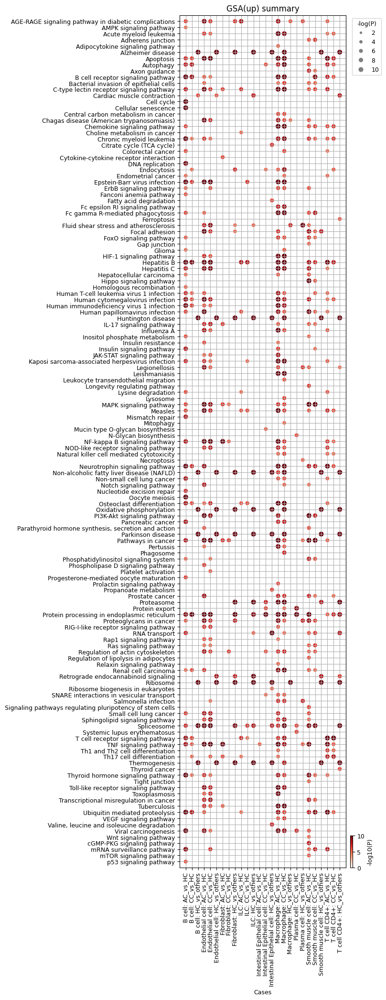

In [ ]:
plot_gsa_dot( adata_t.uns['GSA_vs_ref_up'],
              pval_cutoff = 1e-5,
              title = 'GSA(up) summary',
              title_fs = 12,
              tick_fs = 9,
              xtick_rot = 90,
              xtick_ha = 'center',
              label_fs = 9,
              legend_fs = 9,
              swap_ax = False,
              figsize = None,
              dpi = 100,
              dot_size = 40,
              cbar_frac = 0.05,
              cbar_aspect = 15,
              cmap = 'Reds' )

### __F. GSEA results__
#### Data structure and format are the same as those for GSA results

In [ ]:
show_tree(adata_t.uns['GSEA_vs_ref'], max_depth = 3, n_to_show = 3)

Dictionary Structure (top-level):
├── B cell                    : (dict)
│    ├── AC_vs_HC    : DataFrame (235, 12), cols=[Name, ES, NES, ... ])
│    ├── CC_vs_HC    : DataFrame (233, 12), cols=[Name, ES, NES, ... ])
│    └── HC_vs_others: DataFrame (213, 12), cols=[Name, ES, NES, ... ])
├── Endothelial cell          : (dict)
│    ├── AC_vs_HC    : DataFrame (240, 12), cols=[Name, ES, NES, ... ])
│    ├── CC_vs_HC    : DataFrame (238, 12), cols=[Name, ES, NES, ... ])
│    └── HC_vs_others: DataFrame (234, 12), cols=[Name, ES, NES, ... ])
├── Fibroblast                : (dict)
│    ├── AC_vs_HC    : DataFrame (255, 12), cols=[Name, ES, NES, ... ])
│    ├── CC_vs_HC    : DataFrame (200, 12), cols=[Name, ES, NES, ... ])
│    └── HC_vs_others: DataFrame (249, 12), cols=[Name, ES, NES, ... ])
├── ILC                       : (dict)
│    ├── AC_vs_HC    : DataFrame (223, 12), cols=[Name, ES, NES, ... ])
│    ├── CC_vs_HC    : DataFrame (176, 12), cols=[Name, ES, NES, ... ])
│    └── HC_vs_oth

#### __F.1 Barplot visualization of condition-specific pathways activity__

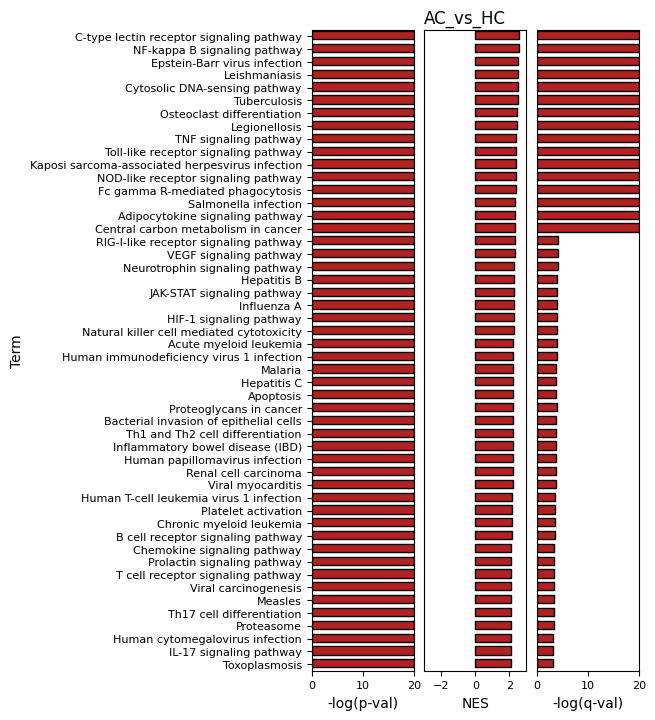

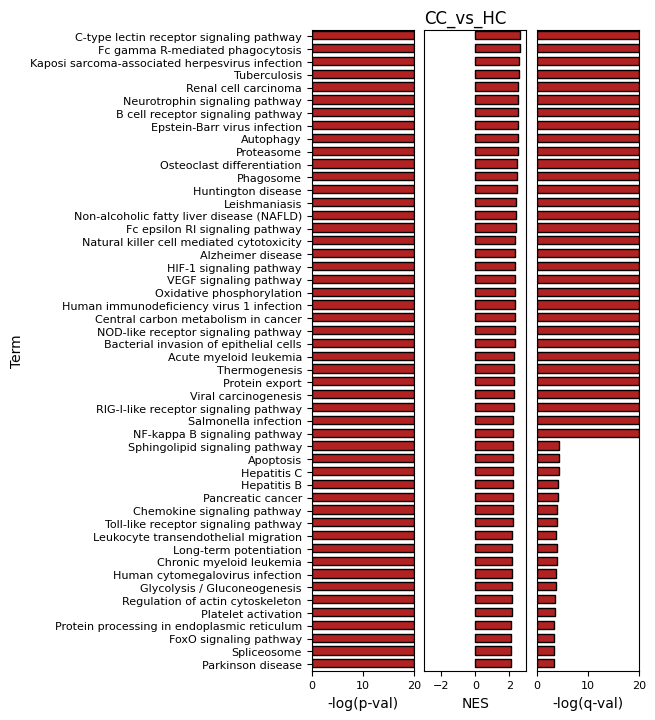

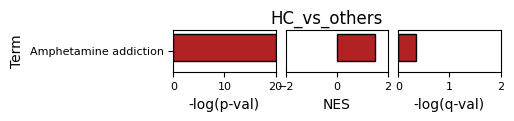

In [ ]:
target_cell = 'Macrophage'

df_sel_dct = plot_gsa_bar( adata_t.uns['GSEA_vs_ref'][target_cell],
                           pval_cutoff = 1e-5,
                           nes_cutoff = 0,
                           N_max_to_show = 50,
                           title = None,
                           bar_width = 0.8,
                           title_pos = (0.5, 1),
                           title_fs = 12,
                           title_ha = 'center',
                           label_fs = 10,
                           tick_fs = 8,
                           wspace=0.1,
                           hspace=0.25,
                           Ax = None,
                           facecolor = 'firebrick',
                           edgecolor = 'black' )

#### __F.2 Dotplot visualization for an overview of condition-specific pathways activity__

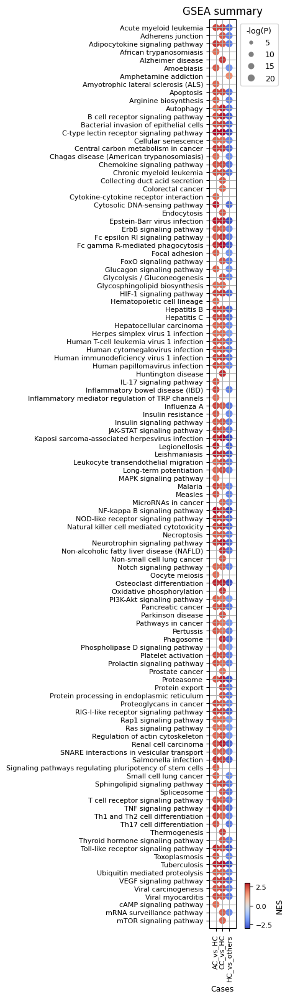

In [ ]:
# target_cell = 'Aneuploid Epithelial cell'
target_cell = 'Macrophage'

plot_gsa_dot( adata_t.uns['GSEA_vs_ref'][target_cell],
              pval_cutoff = 1e-5,
              title = 'GSEA summary',
              title_fs = 12,
              tick_fs = 8,
              xtick_rot = 90,
              xtick_ha = 'center',
              label_fs = 9,
              legend_fs = 9,
              swap_ax = False,
              figsize = None,
              dpi = 100,
              dot_size = 50,
              cbar_frac = 0.1,
              cbar_aspect = 10,
              cmap = 'coolwarm',
              pval_clip = 1e-20)

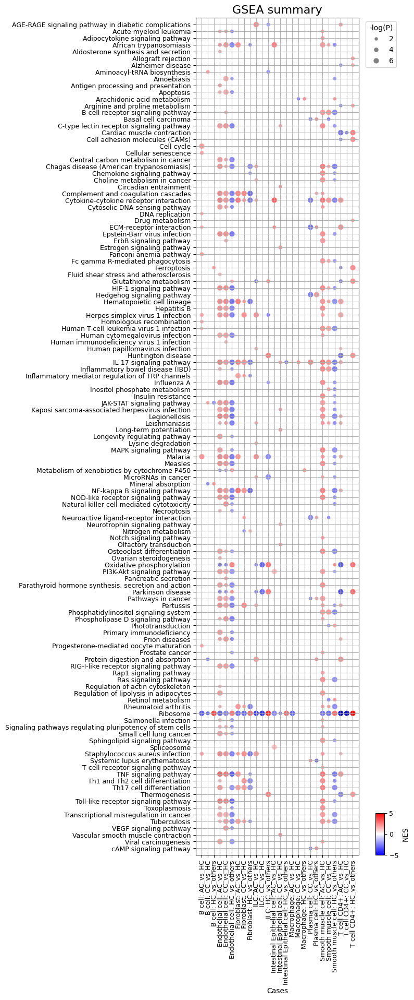

In [ ]:
plot_gsa_dot( adata_t.uns['GSEA_vs_ref'],
              pval_cutoff = 1e-2,
              title = 'GSEA summary',
              title_fs = 16,
              tick_fs = 9,
              xtick_rot = 90,
              xtick_ha = 'center',
              label_fs = 10,
              legend_fs = 10,
              swap_ax = False,
              figsize = None,
              dpi = 100,
              dot_size = 40,
              cbar_frac = 0.2,
              cbar_aspect = 5,
              cmap = 'bwr',
              pval_clip = 1e-6)